###Ballarat-Aerodrome
#1.	Download the data and load the data into a Colab/ Jupyter notebook using appropriate data structures (for instance pandas dataframe).

In [ ]:
from google.colab import drive
import pandas as pd

drive.mount('/content/drive')
file_paths = [
    '/content/drive/My Drive/ds/weather/Rainfall-Ballarat-Aerodrome.csv',
    '/content/drive/My Drive/ds/weather/SolarExposure-Ballarat-Aerodrome.csv',
    '/content/drive/My Drive/ds/weather/Temperature-Ballarat-Aerodrome.csv',
    '/content/drive/My Drive/ds/koala/Bridget_PinPoint.csv',
    '/content/drive/My Drive/ds/koala/Catherine_PinPoint.csv'
]
df_rainfall = pd.read_csv(file_paths[0])
df_solar_exposure = pd.read_csv(file_paths[1])
df_temperature = pd.read_csv(file_paths[2])
df_bridget = pd.read_csv(file_paths[3])
df_catherine = pd.read_csv(file_paths[4])

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# print("Rainfall Data:")
# print(df_rainfall.head())
# print("\nSolar Exposure Data:")
# print(df_solar_exposure.head())
# print("\nTemperature Data:")
# print(df_temperature.head())
# print("\nBridget's Data:")
# print(df_bridget.head())
# print("\nCatherine's Data:")
# print(df_catherine.head())

#2.	The timestamp is GMT, convert it to AEST.

In [ ]:
from datetime import datetime
import pytz

gmt = pytz.timezone('GMT')
aest = pytz.timezone('Australia/Sydney')

def parse_datetime(date_str):
    for fmt in ('%m/%d/%Y %H:%M', '%d/%m/%Y %I:%M:%S %p', '%d/%m/%Y %H:%M:%S', '%d/%m/%Y %H:%M'):
        try:
            return datetime.strptime(date_str, fmt)
        except ValueError:
            pass
    return None

df_catherine['GMT Time'] = df_catherine['GMT Time'].apply(parse_datetime)
df_catherine = df_catherine.dropna(subset=['GMT Time'])
df_catherine['GMT Time'] = df_catherine['GMT Time'].apply(lambda x: gmt.localize(x))
df_catherine['AEST Time'] = df_catherine['GMT Time'].apply(lambda x: x.astimezone(aest))
df_catherine['AEST Time'] = df_catherine['AEST Time'].dt.tz_localize(None)
print(df_catherine)


                      GMT Time   Latitude   Longitude  Altitude  Duration  \
0    2023-02-08 10:00:00+00:00 -37.243271  143.624663    333.27        53   
1    2023-02-08 12:01:00+00:00 -37.243288  143.624550    347.22        62   
2    2023-02-08 14:01:00+00:00   0.000000    0.000000      0.00        70   
3    2023-02-08 18:01:00+00:00 -37.243122  143.623480     -0.25        70   
4    2023-02-08 20:01:00+00:00   0.000000    0.000000      0.00        70   
...                        ...        ...         ...       ...       ...   
1098 2024-01-02 11:01:00+00:00   0.000000    0.000000      0.00        70   
1099 2024-01-02 13:01:00+00:00   0.000000    0.000000      0.00        70   
1100 2024-01-02 17:01:00+00:00 -37.586956  143.886946    456.81        65   
1101 2024-01-02 19:00:00+00:00 -37.586923  143.886950    456.73        35   
1102 2024-02-02 03:01:00+00:00 -37.586920  143.886953    471.89        66   

      Temperature  Voltage   DOP  Satellites  Cause of Fix           AEST T

In [ ]:
df_bridget['Date'] = df_bridget['Date'].str.replace(' 0:00', '')

print("Bridget Data after preprocessing the Date column:")
print(df_bridget.head())
df_bridget.to_csv('merged_bridget.csv', index=False)

Bridget Data after preprocessing the Date column:
        Date Month         Time  Latitude  Longitude  Altitude  Duration  \
0  2/02/2024   Feb   3:01:10 AM       0.0        0.0       0.0        70   
1  2/02/2024   Feb   9:01:10 AM       0.0        0.0       0.0        70   
2  2/02/2024   Feb  11:01:10 AM       0.0        0.0       0.0        70   
3  2/02/2024   Feb   1:01:11 PM       0.0        0.0       0.0        70   
4  2/02/2024   Feb   5:01:11 PM       0.0        0.0       0.0        70   

   Temperature  Voltage  DOP  Satellites  Cause of Fix  
0         24.5      3.8  0.0           0  GPS Schedule  
1         25.0      3.8  0.0           0  GPS Schedule  
2         24.5      3.8  0.0           0  GPS Schedule  
3         24.0      3.8  0.0           0  GPS Schedule  
4         23.0      3.8  0.0           0  GPS Schedule  


In [ ]:
from datetime import datetime
import pytz

def convert_to_aest(gmt_time):
    gmt_dt = gmt.localize(datetime.strptime(gmt_time, '%d/%m/%Y %I:%M:%S %p'))
    aest_dt = gmt_dt.astimezone(aest)
    return aest_dt.strftime('%Y-%m-%d %H:%M:%S')

df_bridget['combined_datetime'] = df_bridget['Date'].astype(str) + ' ' + df_bridget['Time']
df_bridget['AEST Time'] = df_bridget['combined_datetime'].apply(convert_to_aest)

print("Bridget(AEST Timestamps):")
print(df_bridget.head())

Bridget(AEST Timestamps):
        Date Month         Time  Latitude  Longitude  Altitude  Duration  \
0  2/02/2024   Feb   3:01:10 AM       0.0        0.0       0.0        70   
1  2/02/2024   Feb   9:01:10 AM       0.0        0.0       0.0        70   
2  2/02/2024   Feb  11:01:10 AM       0.0        0.0       0.0        70   
3  2/02/2024   Feb   1:01:11 PM       0.0        0.0       0.0        70   
4  2/02/2024   Feb   5:01:11 PM       0.0        0.0       0.0        70   

   Temperature  Voltage  DOP  Satellites  Cause of Fix      combined_datetime  \
0         24.5      3.8  0.0           0  GPS Schedule   2/02/2024 3:01:10 AM   
1         25.0      3.8  0.0           0  GPS Schedule   2/02/2024 9:01:10 AM   
2         24.5      3.8  0.0           0  GPS Schedule  2/02/2024 11:01:10 AM   
3         24.0      3.8  0.0           0  GPS Schedule   2/02/2024 1:01:11 PM   
4         23.0      3.8  0.0           0  GPS Schedule   2/02/2024 5:01:11 PM   

             AEST Time  
0  20

# Merging data

#3.	Determine if the Aerodrome weather data is close enough to the koala site and if there is anything closer, download and use the more accurate data.

In [ ]:
# df_catherine= df_catherine[(df_catherine['Latitude'] != 0) & (df_catherine['Longitude'] != 0)]
# df_bridget = df_bridget[(df_bridget['Latitude'] != 0) & (df_bridget['Longitude'] != 0)]

# catherine_max_lat = df_catherine['Latitude'].max()
# catherine_min_lat = df_catherine['Latitude'].min()
# catherine_max_lon = df_catherine['Longitude'].max()
# catherine_min_lon = df_catherine['Longitude'].min()

# bridget_max_lat = df_bridget['Latitude'].max()
# bridget_min_lat = df_bridget['Latitude'].min()
# bridget_max_lon = df_bridget['Longitude'].max()
# bridget_min_lon = df_bridget['Longitude'].min()

# print("Catherine:")
# print("Max Latitude:", catherine_max_lat)
# print("Min Latitude:", catherine_min_lat)
# print("Max Longitude:", catherine_max_lon)
# print("Min Longitude:", catherine_min_lon)

# print("\nBridget:")
# print("Max Latitude:", bridget_max_lat)
# print("Min Latitude:", bridget_min_lat)
# print("Max Longitude:", bridget_max_lon)
# print("Min Longitude:", bridget_min_lon)

In [ ]:
# import geopandas as gpd
# import matplotlib.pyplot as plt

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
# countries = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
# countries[countries["name"] == "Australia"].plot(color="lightgrey", ax=ax1)
# countries[countries["name"] == "Australia"].plot(color="lightgrey", ax=ax2)

# df_bridget.plot(x="Longitude", y="Latitude", kind="scatter",
#                  cmap="YlOrRd",
#                 title="Temperature in Australia (Bridget)",
#                 ax=ax1)
# df_catherine.plot(x="Longitude", y="Latitude", kind="scatter",
#                    cmap="YlOrRd",
#                   title="Temperature in Australia (Catherine)",
#                   ax=ax2)
# ax1.grid(True, alpha=0.5)
# ax2.grid(True, alpha=0.5)
# plt.show()


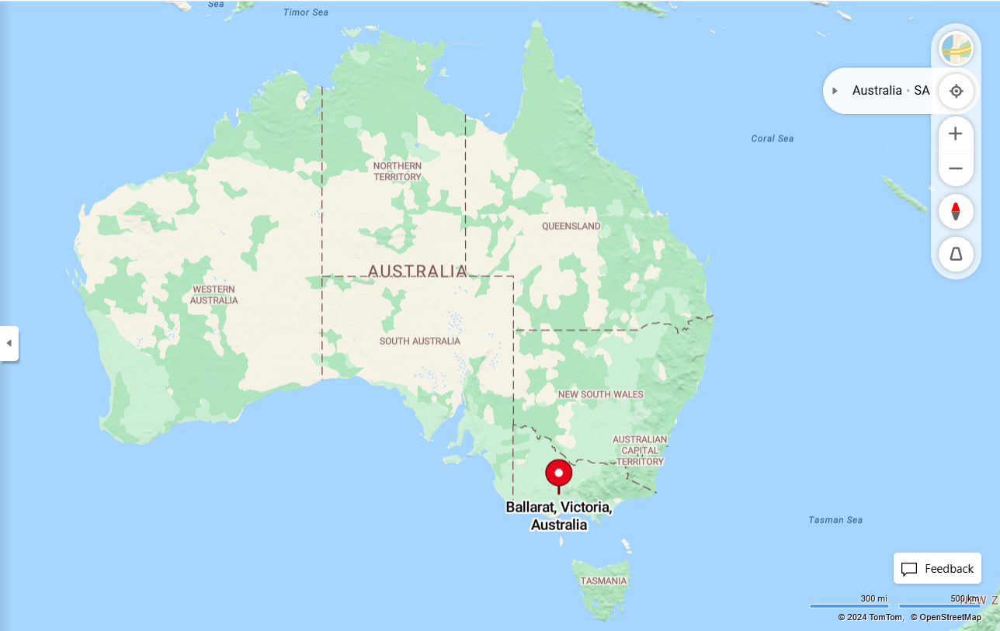

-37.560830, 143.847500
which represent the best area for our analysis.

# 4.	Create a new file for each koala, merging the weather data with the tracklog data.   

In [ ]:
import pandas as pd

df_catherine['date'] = pd.to_datetime(df_catherine['AEST Time']).dt.date
df_bridget['date'] = pd.to_datetime(df_bridget['AEST Time']).dt.date

def create_datetime_column(df, year_col='Year', month_col='Month', day_col='Day'):
    return pd.to_datetime(df[[year_col, month_col, day_col]].astype(str).agg('-'.join, axis=1)).dt.date

df_rainfall['date'] = create_datetime_column(df_rainfall)
df_solar_exposure['date'] = create_datetime_column(df_solar_exposure)
df_temperature['date'] = create_datetime_column(df_temperature)


merged_catherine_df = pd.merge(df_catherine, df_rainfall, on='date', how='left')
merged_catherine_df = pd.merge(merged_catherine_df, df_solar_exposure, on='date', how='left')
merged_catherine_df = pd.merge(merged_catherine_df, df_temperature, on='date', how='left')


merged_df_bridget = pd.merge(df_bridget, df_rainfall, on='date', how='left')
merged_df_bridget = pd.merge(merged_df_bridget, df_solar_exposure, on='date', how='left')
df_temperature = df_temperature.rename(columns={"Month": "Month_temperature"})
merged_df_bridget = pd.merge(merged_df_bridget, df_temperature, on='date', how='left')

In [ ]:
merged_df_bridget.to_csv('merged_bridget.csv', index=False)
merged_catherine_df.to_csv('merged_catherine.csv', index=False)

## Outlier detection

In [ ]:
# from math import radians, sin, cos, sqrt, atan2

# def haversine(lat1, lon1, lat2, lon2):
#     # Convert latitude and longitude from degrees to radians
#     lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

#     # Haversine formula
#     dlon = lon2 - lon1
#     dlat = lat2 - lat1
#     a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
#     c = 2 * atan2(sqrt(a), sqrt(1-a))
#     distance = 6371 * c  # Radius of Earth in kilometers
#     return distance

# # Coordinates for Aerodrome
# aerodrome_lat = -37.560830
# aerodrome_lon = 143.847500

# # Coordinates for Catherine's koala site
# catherine_max_lat = -37.2399823
# catherine_min_lat = -37.6455403
# catherine_max_lon = 143.9171786
# catherine_min_lon = 143.6227441

# # Coordinates for Bridget's koala site
# bridget_max_lat = -37.4481258
# bridget_min_lat = -37.6386357
# bridget_max_lon = 143.9412377
# bridget_min_lon = 143.8546738

# # Calculate distances
# catherine_distance = haversine((catherine_max_lat + catherine_min_lat) / 2, (catherine_max_lon + catherine_min_lon) / 2, aerodrome_lat, aerodrome_lon)
# bridget_distance = haversine((bridget_max_lat + bridget_min_lat) / 2, (bridget_max_lon + bridget_min_lon) / 2, aerodrome_lat, aerodrome_lon)

# print("Distance from Aerodrome to Catherine's koala site:", catherine_distance, "km")
# print("Distance from Aerodrome to Bridget's koala site:", bridget_distance, "km")



# 5.	Calculate the distance travelled by the koala from the previous timepoint, for each timepoint - add an extra feature to the tracklog which is DistanceTravelled.


In [ ]:
from geopy.distance import geodesic

def calculate_distance(df, lat_col='Latitude', lon_col='Longitude'):
    distances = [0]
    for i in range(1, len(df)):
        prev_coords = (df.at[i - 1, lat_col], df.at[i - 1, lon_col])
        current_coords = (df.at[i, lat_col], df.at[i, lon_col])
        distance = geodesic(prev_coords, current_coords).kilometers
        distances.append(distance)
    return distances


merged_df_bridget['DistanceTravelled'] = calculate_distance(merged_df_bridget)
merged_catherine_df['DistanceTravelled'] = calculate_distance(merged_catherine_df)

#6.	Calculate the speed of the koala at each timepoint - add an extra feature to the tracklog which is Speed.

In [ ]:
def calculate_speed(df, lat_col='Latitude', lon_col='Longitude', time_col='AEST Time'):
    speeds = [0]
    for i in range(1, len(df)):
        prev_coords = (df.at[i - 1, lat_col], df.at[i - 1, lon_col])
        current_coords = (df.at[i, lat_col], df.at[i, lon_col])
        distance = geodesic(prev_coords, current_coords).kilometers

        prev_time = datetime.strptime(str(df.at[i - 1, time_col]), '%Y-%m-%d %H:%M:%S')
        current_time = datetime.strptime(str(df.at[i, time_col]), '%Y-%m-%d %H:%M:%S')
        time_diff = (current_time - prev_time).total_seconds()
        if time_diff == 0:  # Avoid division by zero
            speeds.append(0)
        else:
            speed = (distance / time_diff) * 3600
            speeds.append(speed)
    return speeds


merged_df_bridget['Speed'] = calculate_speed(merged_df_bridget)
merged_catherine_df['Speed'] = calculate_speed(merged_catherine_df)
print(merged_catherine_df)



                      GMT Time   Latitude   Longitude  Altitude  Duration  \
0    2023-02-08 10:00:00+00:00 -37.243271  143.624663    333.27        53   
1    2023-02-08 12:01:00+00:00 -37.243288  143.624550    347.22        62   
2    2023-02-08 14:01:00+00:00   0.000000    0.000000      0.00        70   
3    2023-02-08 18:01:00+00:00 -37.243122  143.623480     -0.25        70   
4    2023-02-08 20:01:00+00:00   0.000000    0.000000      0.00        70   
...                        ...        ...         ...       ...       ...   
1098 2024-01-02 11:01:00+00:00   0.000000    0.000000      0.00        70   
1099 2024-01-02 13:01:00+00:00   0.000000    0.000000      0.00        70   
1100 2024-01-02 17:01:00+00:00 -37.586956  143.886946    456.81        65   
1101 2024-01-02 19:00:00+00:00 -37.586923  143.886950    456.73        35   
1102 2024-02-02 03:01:00+00:00 -37.586920  143.886953    471.89        66   

      Temperature  Voltage   DOP  Satellites  Cause of Fix  ... Product cod

In [ ]:
merged_catherine_df.to_csv('merged_bridget.csv', index=False)


#7.	Calculate the orientation/direction of the koala at each timepoint – add an extra feature to the tracklog which is Direction.

In [ ]:
import numpy as np
def calculate_bearing(lat1, lon1, lat2, lon2):
    lat1 = np.radians(lat1)
    lon1 = np.radians(lon1)
    lat2 = np.radians(lat2)
    lon2 = np.radians(lon2)
    delta_lon = lon2 - lon1
    x = np.sin(delta_lon) * np.cos(lat2)
    y = np.cos(lat1) * np.sin(lat2) - (np.sin(lat1) * np.cos(lat2) * np.cos(delta_lon))
    initial_bearing = np.arctan2(x, y)
    initial_bearing = np.degrees(initial_bearing)
    bearing = (initial_bearing + 360) % 360

    return bearing

def add_bearing_column(df, lat_col='Latitude', lon_col='Longitude'):
    bearings = [0]
    for i in range(1, len(df)):
        lat1, lon1 = df.at[i - 1, lat_col], df.at[i - 1, lon_col]
        lat2, lon2 = df.at[i, lat_col], df.at[i, lon_col]
        bearing = calculate_bearing(lat1, lon1, lat2, lon2)
        bearings.append(bearing)
    return bearings


merged_df_bridget['Bearing'] = add_bearing_column(merged_df_bridget)
merged_catherine_df['Bearing'] = add_bearing_column(merged_catherine_df)
print(merged_df_bridget.to_string())

           Date Month_x         Time   Latitude   Longitude  Altitude  Duration  Temperature  Voltage   DOP  Satellites  Cause of Fix       combined_datetime            AEST Time        date Product code_x  Bureau of Meteorology station number_x  Year_x  Month_y  Day_x  Rainfall amount (millimetres)  Period over which rainfall was measured (days) Quality_x Product code_y  Bureau of Meteorology station number_y  Year_y  Month  Day_y  Daily global solar exposure (MJ/m*m) Product code  Bureau of Meteorology station number  Year  Month_temperature  Day  Maximum temperature (Degree C)  Days of accumulation of maximum temperature Quality_y  DistanceTravelled        Speed     Bearing
0     2/02/2024     Feb   3:01:10 AM   0.000000    0.000000      0.00        70         24.5      3.8   0.0           0  GPS Schedule    2/02/2024 3:01:10 AM  2024-02-02 14:01:10  2024-02-02     IDCJAC0009                                   89002    2024        2      2                            0.2              

#8.	Develop a method to detect possible outliers based on significant changes in DistanceTravelled, Speed and Direction.

In [ ]:
def identify_outliers(df):
    outliers = []

    for i in range(len(df)):
        if (df.at[i, 'DistanceTravelled'] == 0 and
            df.at[i, 'Bearing'] == 0 and
            df.at[i, 'Speed'] == 0):
            outliers.append(i)
        elif (df.at[i, 'DistanceTravelled'] > 100 or
              df.at[i, 'Bearing'] > 300 or
              df.at[i, 'Speed'] > 10):
            if i > 0 and df.at[i - 1, 'Latitude'] == 0 and df.at[i - 1, 'Longitude'] == 0:
                outliers.append(i - 1)
            elif df.at[i, 'Latitude'] == 0 and df.at[i, 'Longitude'] == 0:
                outliers.append(i)

    return outliers


outliers_indices_bridget = identify_outliers(merged_df_bridget)
outliers_indices_catherine = identify_outliers(merged_catherine_df)
print("Indices of identified outliers of bridget:", outliers_indices_bridget)
print("Indices of identified outliers of catherine:", outliers_indices_catherine)

print("Identified outliers:")
print(merged_df_bridget.iloc[outliers_indices_bridget].to_string())
print(merged_catherine_df.iloc[outliers_indices_catherine].to_string())


Indices of identified outliers of bridget: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 21, 23, 23, 36, 36, 46, 46, 54, 54, 60, 60, 66, 67, 67, 76, 76, 78, 78, 85, 85, 97, 97, 99, 99, 106, 107, 107, 110, 110, 117, 118, 118, 127, 127, 142, 142, 172, 172, 175, 175, 178, 178, 181, 181, 204, 204, 209, 209, 215, 216, 216, 221, 222, 222, 228, 229, 229, 236, 236, 247, 247]
Indices of identified outliers of catherine: [0, 2, 2, 4, 5, 6, 7, 7, 9, 9, 11, 12, 13, 13, 16, 16, 26, 27, 27, 42, 42, 50, 50, 62, 62, 123, 124, 124, 128, 128, 153, 153, 165, 166, 166, 177, 177, 183, 183, 192, 192, 194, 195, 195, 203, 203, 215, 216, 217, 217, 220, 221, 221, 224, 224, 260, 261, 261, 264, 264, 267, 267, 274, 274, 281, 281, 300, 300, 306, 306, 309, 309, 312, 312, 321, 321, 326, 326, 354, 354, 357, 357, 363, 363, 383, 383, 390, 390, 394, 394, 416, 417, 417, 420, 421, 421, 426, 426, 429, 429, 435, 435, 443, 443, 448, 449, 449, 453, 453, 458, 458, 474, 474, 477, 477, 483, 484, 4

In [ ]:
merged_df_bridget_cleaned = merged_df_bridget.drop(outliers_indices_bridget).reset_index(drop=True)

merged_catherine_df_cleaned = merged_catherine_df.drop(outliers_indices_catherine).reset_index(drop=True)
merged_catherine_df_cleaned = merged_catherine_df_cleaned.drop([0,1,2,3]).reset_index(drop=True)


# Print cleaned DataFrames


merged_df_bridget_cleaned["DistanceTravelled"]=calculate_distance(merged_df_bridget_cleaned)
merged_df_bridget_cleaned["Speed"]=calculate_speed(merged_df_bridget_cleaned)
merged_df_bridget_cleaned["Bearing"]=add_bearing_column(merged_df_bridget_cleaned)

merged_catherine_df_cleaned["DistanceTravelled"]=calculate_distance(merged_catherine_df_cleaned)
merged_catherine_df_cleaned["Speed"]=calculate_speed(merged_catherine_df_cleaned)
merged_catherine_df_cleaned["Bearing"]=add_bearing_column(merged_catherine_df_cleaned)
print("Cleaned DataFrame merged_df_bridget:")
print(merged_df_bridget_cleaned.to_string())

print("\nCleaned DataFrame merged_catherine_df:")
print(merged_catherine_df_cleaned.to_string())

Cleaned DataFrame merged_df_bridget:
           Date Month_x         Time   Latitude   Longitude  Altitude  Duration  Temperature  Voltage   DOP  Satellites  Cause of Fix       combined_datetime            AEST Time        date Product code_x  Bureau of Meteorology station number_x  Year_x  Month_y  Day_x  Rainfall amount (millimetres)  Period over which rainfall was measured (days) Quality_x Product code_y  Bureau of Meteorology station number_y  Year_y  Month  Day_y  Daily global solar exposure (MJ/m*m) Product code  Bureau of Meteorology station number  Year  Month_temperature  Day  Maximum temperature (Degree C)  Days of accumulation of maximum temperature Quality_y  DistanceTravelled     Speed     Bearing
0     5/02/2024     Feb   4:55:55 PM -37.638636  143.854674     -0.06        70         21.5      3.8   6.2           3  GPS Schedule    5/02/2024 4:55:55 PM  2024-02-06 03:55:55  2024-02-06     IDCJAC0009                                   89002    2024        2      6           

In [ ]:
merged_df_bridget_cleaned = merged_df_bridget_cleaned.drop([0]).reset_index(drop=True)
merged_df_bridget_cleaned["DistanceTravelled"]=calculate_distance(merged_df_bridget_cleaned)
merged_df_bridget_cleaned["Speed"]=calculate_speed(merged_df_bridget_cleaned)
merged_df_bridget_cleaned["Bearing"]=add_bearing_column(merged_df_bridget_cleaned)

In [ ]:
print(merged_catherine_df_cleaned.sort_values(by='Latitude', ascending=True))

                     GMT Time   Latitude   Longitude  Altitude  Duration  \
0   2023-04-08 14:01:00+00:00 -37.645540  143.859894      0.24        70   
251 2023-09-20 12:01:11+00:00 -37.641614  143.897374      0.34        70   
1   2023-04-08 18:01:00+00:00 -37.638655  143.860567     31.62        70   
681 2023-12-16 13:01:07+00:00 -37.626338  143.903484     -0.11        70   
537 2023-11-15 19:01:11+00:00 -37.613300  143.886880      0.15        70   
..                        ...        ...         ...       ...       ...   
862 2024-01-29 13:01:10+00:00 -37.579632  143.890404     -0.22        70   
867 2024-01-31 03:01:03+00:00 -37.578616  143.880745      0.31        70   
13  2023-07-08 10:01:00+00:00 -37.578598  143.896698     -0.39        70   
701 2023-12-20 13:01:11+00:00 -37.568025  143.874359     -0.28        70   
642 2023-08-12 03:00:00+00:00 -37.564364  143.867789     -0.08        70   

     Temperature  Voltage   DOP  Satellites  Cause of Fix  ...  \
0           30.5     

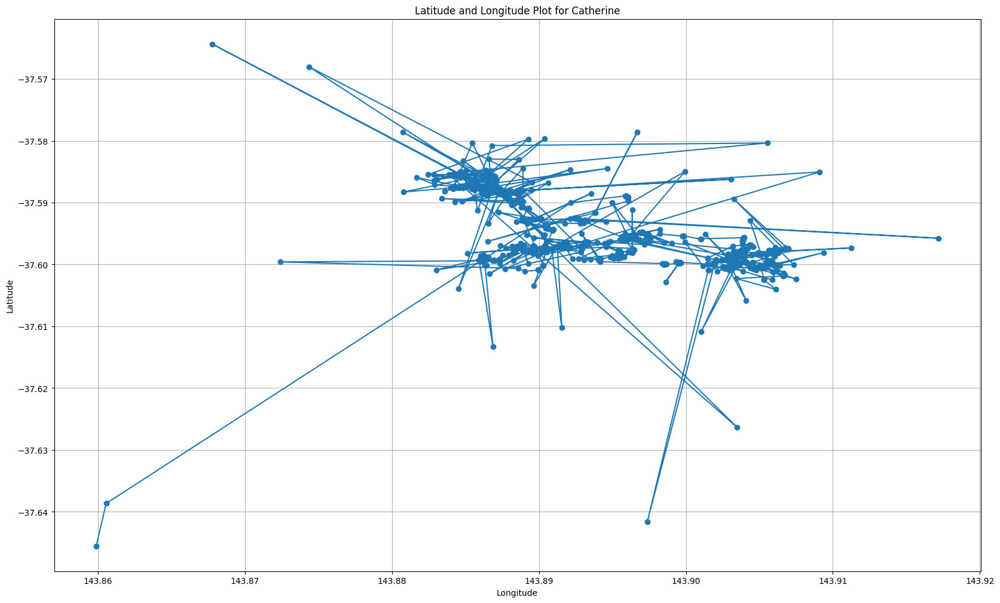

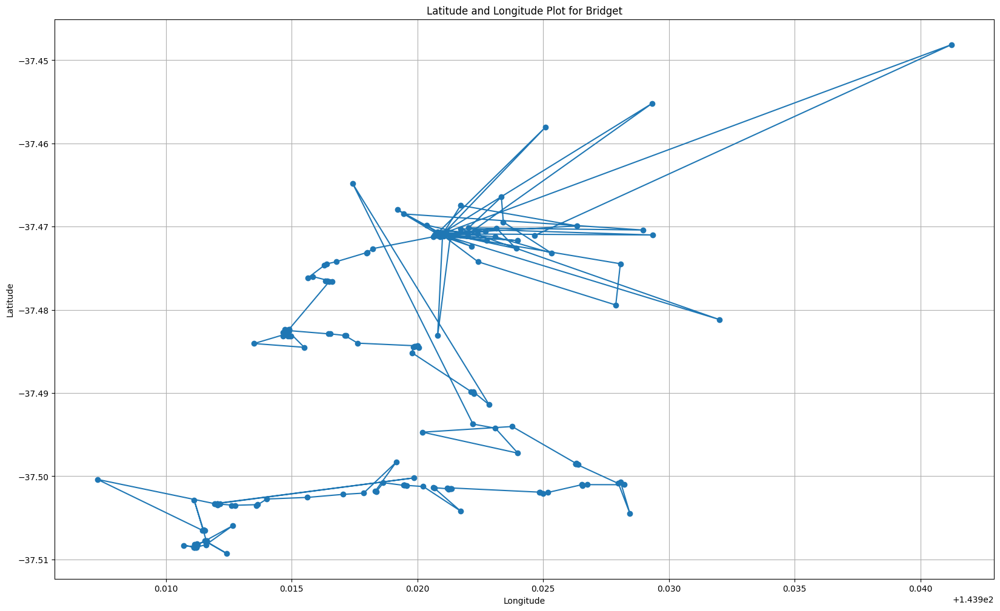

In [ ]:
import matplotlib.pyplot as plt

def plot_with_annotations(df, title):
    plt.figure(figsize=(20, 12))
    plt.plot(df['Longitude'], df['Latitude'], marker='o', linestyle='-')
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)
    plt.show()

plot_with_annotations(merged_catherine_df_cleaned, 'Latitude and Longitude Plot for Catherine')
plot_with_annotations(merged_df_bridget_cleaned, 'Latitude and Longitude Plot for Bridget')


In [ ]:
# import pickle

# with open('merged_df_bridget_cleaned.pkl', 'wb') as f:
#     pickle.dump(merged_df_bridget_cleaned, f)

# with open('merged_catherine_df_cleaned.pkl', 'wb') as f:
#     pickle.dump(merged_catherine_df_cleaned, f)


In [ ]:
# import pickle

# with open('merged_df_bridget_cleaned.pkl', 'rb') as f:
#     merged_df_bridget_cleaned = pickle.load(f)

# with open('merged_catherine_df_cleaned.pkl', 'rb') as f:
#     merged_catherine_df_cleaned = pickle.load(f)


In [ ]:
print(merged_df_bridget_cleaned.to_string())

           Date Month_x         Time   Latitude   Longitude  Altitude  Duration  Temperature  Voltage   DOP  Satellites  Cause of Fix       combined_datetime            AEST Time        date Product code_x  Bureau of Meteorology station number_x  Year_x  Month_y  Day_x  Rainfall amount (millimetres)  Period over which rainfall was measured (days) Quality_x Product code_y  Bureau of Meteorology station number_y  Year_y  Month  Day_y  Daily global solar exposure (MJ/m*m) Product code  Bureau of Meteorology station number  Year  Month_temperature  Day  Maximum temperature (Degree C)  Days of accumulation of maximum temperature Quality_y  DistanceTravelled     Speed     Bearing
0     6/02/2024     Feb   3:00:35 AM -37.508558  143.911156    591.84        34         29.0      3.8   1.2           6  GPS Schedule    6/02/2024 3:00:35 AM  2024-02-06 14:00:35  2024-02-06     IDCJAC0009                                   89002    2024        2      6                            0.0                 

#9.	Find a method that can “smooth” the tracklog, so it does not ‘zigzag’ so much. E.g. moving window average

In [ ]:
def smooth_track_log(df, window_size):
    df['Latitude_Smoothed'] = df['Latitude'].rolling(window=window_size, min_periods=1).mean()
    df['Longitude_Smoothed'] = df['Longitude'].rolling(window=window_size, min_periods=1).mean()
    return df

window_size = 2
merged_df_bridget_cleaned_smoothed = smooth_track_log(merged_df_bridget_cleaned.copy(), window_size)
merged_catherine_df_cleaned_smoothed = smooth_track_log(merged_catherine_df_cleaned.copy(), window_size)


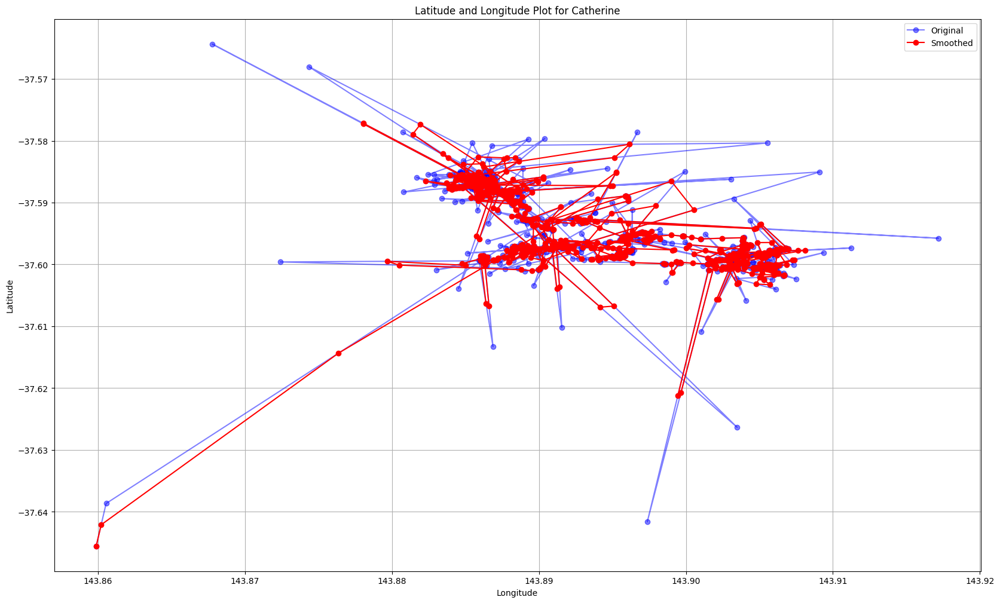

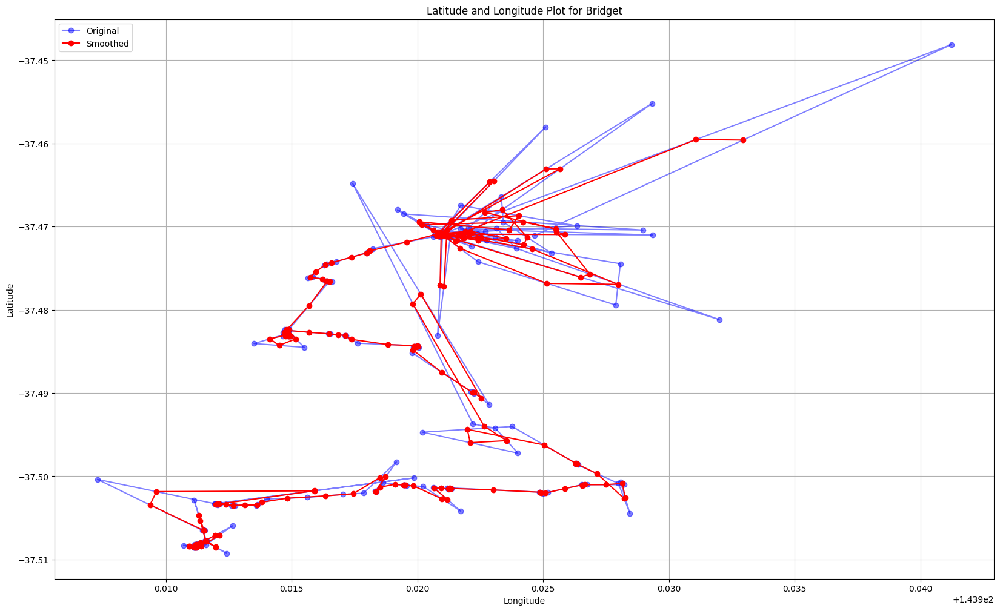

In [ ]:
import matplotlib.pyplot as plt

def plot_with_annotations(df_original, df_smoothed, title):
    plt.figure(figsize=(20, 12))

    plt.plot(df_original['Longitude'], df_original['Latitude'], marker='o', linestyle='-', label='Original', color="blue" ,alpha=0.5)


    plt.plot(df_smoothed['Longitude_Smoothed'], df_smoothed['Latitude_Smoothed'], marker='o', linestyle='-', color='red', label='Smoothed')


    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)
    plt.legend()
    plt.show()

plot_with_annotations(merged_catherine_df_cleaned, merged_catherine_df_cleaned_smoothed, 'Latitude and Longitude Plot for Catherine')

plot_with_annotations(merged_df_bridget_cleaned, merged_df_bridget_cleaned_smoothed, 'Latitude and Longitude Plot for Bridget')


# Checking test

In [ ]:
merged_catherine_df_cleaned

,GMT Time,Latitude,Longitude,Altitude,Duration,Temperature,Voltage,DOP,Satellites,Cause of Fix,...,Bureau of Meteorology station number,Year,Month,Day,Maximum temperature (Degree C),Days of accumulation of maximum temperature,Quality_y,DistanceTravelled,Speed,Bearing
0,2023-04-08 14:01:00+00:00,-37.645540,143.859894,0.24,70,30.5,3.9,6.0,3,GPS Schedule,...,89002.0,2023.0,4.0,9.0,12.1,1.0,N,0.000000,0.000000e+00,0.000000
1,2023-04-08 18:01:00+00:00,-37.638655,143.860567,31.62,70,23.0,3.9,2.2,4,GPS Schedule,...,89002.0,2023.0,4.0,9.0,12.1,1.0,N,0.766554,1.916384e-01,4.421716
2,2023-05-08 04:01:00+00:00,-37.590026,143.892180,107.65,70,21.0,3.8,3.2,4,GPS Schedule,...,89002.0,2023.0,5.0,8.0,11.4,1.0,N,6.076235,8.606565e-03,27.256268
3,2023-05-08 10:00:00+00:00,-37.588910,143.895861,512.78,53,24.0,3.8,1.8,5,GPS Schedule,...,89002.0,2023.0,5.0,8.0,11.4,1.0,N,0.347906,5.814591e-02,69.070101
4,2023-05-08 12:00:00+00:00,-37.588932,143.895914,522.78,35,36.5,3.9,1.4,7,GPS Schedule,...,89002.0,2023.0,5.0,8.0,11.4,1.0,N,0.005291,2.645323e-03,117.042624
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
871,2024-01-31 19:01:06+00:00,-37.587819,143.887367,-0.42,70,13.5,3.8,1.8,3,GPS Schedule,...,89002.0,2024.0,2.0,1.0,24.1,1.0,Y,0.102580,5.106998e-02,158.527726
872,2024-01-02 03:01:00+00:00,-37.603918,143.884531,-0.02,70,28.5,3.8,21.0,3,GPS Schedule,...,89002.0,2024.0,1.0,2.0,27.6,1.0,Y,1.804287,-2.534104e-03,187.944677
873,2024-01-02 17:01:00+00:00,-37.586956,143.886946,456.81,65,16.5,3.8,1.6,5,GPS Schedule,...,89002.0,2024.0,1.0,3.0,28.1,1.0,Y,1.894647,1.353319e-01,6.437335
874,2024-01-02 19:00:00+00:00,-37.586923,143.886950,456.73,35,15.0,3.8,1.2,6,GPS Schedule,...,89002.0,2024.0,1.0,3.0,28.1,1.0,Y,0.003737,1.883990e-03,5.673677


In [ ]:
merged_df_bridget_cleaned

,Date,Month_x,Time,Latitude,Longitude,Altitude,Duration,Temperature,Voltage,DOP,...,Bureau of Meteorology station number,Year,Month_temperature,Day,Maximum temperature (Degree C),Days of accumulation of maximum temperature,Quality_y,DistanceTravelled,Speed,Bearing
0,6/02/2024,Feb,3:00:35 AM,-37.508558,143.911156,591.84,34,29.0,3.8,1.2,...,89002,2024,2,6,21.2,1.0,Y,0.000000,0.000000,0.000000
1,6/02/2024,Feb,9:00:33 AM,-37.508474,143.911111,599.17,33,37.5,3.8,1.4,...,89002,2024,2,6,21.2,1.0,Y,0.010201,0.001700,337.238184
2,6/02/2024,Feb,11:00:36 AM,-37.508502,143.911155,593.37,35,28.0,3.8,0.8,...,89002,2024,2,6,21.2,1.0,Y,0.005028,0.002513,129.429287
3,6/02/2024,Feb,1:00:36 PM,-37.508539,143.911101,594.64,35,36.0,3.8,2.2,...,89002,2024,2,7,21.9,1.0,Y,0.006275,0.003138,229.541166
4,6/02/2024,Feb,5:00:57 PM,-37.508462,143.911145,586.11,57,34.0,3.8,1.8,...,89002,2024,2,7,21.9,1.0,Y,0.009385,0.002343,23.985539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,14/03/2024,March,11:01:07 AM,-37.471002,143.929347,-0.51,70,14.5,3.8,6.2,...,89002,2024,3,14,22.0,1.0,N,0.679924,0.084899,96.959888
193,14/03/2024,March,1:01:08 PM,-37.470891,143.922386,112.57,70,14.5,3.8,2.4,...,89002,2024,3,15,NaN,NaN,NaN,0.615927,0.307921,271.149865
194,14/03/2024,March,5:01:08 PM,-37.470948,143.920907,569.53,70,15.5,3.8,3.0,...,89002,2024,3,15,NaN,NaN,NaN,0.130922,0.032730,267.227930
195,14/03/2024,March,7:00:41 PM,-37.448126,143.941238,0.15,70,14.0,3.8,27.0,...,89002,2024,3,15,NaN,NaN,NaN,3.106618,1.559156,35.270633


In [ ]:
# prompt: Using dataframe merged_df_bridget_cleaned: generate as csv

merged_df_bridget_cleaned.to_csv('merged_df_bridget_cleaned.csv')
merged_df_bridget_cleaned.to_csv('merged_catherine_df_cleaned.csv')


In [ ]:
print("Headers of merged_df_bridget:")
print(merged_df_bridget.columns)
print('----')
print("Headers of merged_catherine_df:")

print(merged_catherine_df.columns)



Headers of merged_df_bridget:
Index(['Date', 'Month_x', 'Time', 'Latitude', 'Longitude', 'Altitude',
       'Duration', 'Temperature', 'Voltage', 'DOP', 'Satellites',
       'Cause of Fix', 'combined_datetime', 'AEST Time', 'date',
       'Product code_x', 'Bureau of Meteorology station number_x', 'Year_x',
       'Month_y', 'Day_x', 'Rainfall amount (millimetres)',
       'Period over which rainfall was measured (days)', 'Quality_x',
       'Product code_y', 'Bureau of Meteorology station number_y', 'Year_y',
       'Month', 'Day_y', 'Daily global solar exposure (MJ/m*m)',
       'Product code', 'Bureau of Meteorology station number', 'Year',
       'Month_temperature', 'Day', 'Maximum temperature (Degree C)',
       'Days of accumulation of maximum temperature', 'Quality_y',
       'DistanceTravelled', 'Speed', 'Bearing'],
      dtype='object')
----
Headers of merged_catherine_df:
Index(['GMT Time', 'Latitude', 'Longitude', 'Altitude', 'Duration',
       'Temperature', 'Voltage', 'DO

# **Task 10:** One of the fields for the tracklog relates to GPS error and number of satellites visible. Appendix B shows how researchers have removed points based upon perceived GPS error. Compare the points you considered likely to be outliers based on speed/direction against the GPS fields

In [ ]:
def identify_gps_errors(row, prev_row, next_row):
    errors = []

    if row['DOP'] > 10:
        errors.append('High DOP')

    if row['Satellites'] < 2:
        errors.append('Low Satellites')

    if prev_row is not None and abs(row['Altitude'] - prev_row['Altitude']) > 600:
        errors.append('Altitude Change')
    if next_row is not None and abs(row['Altitude'] - next_row['Altitude']) > 600:
        errors.append('Altitude Change')

    return ', '.join(errors) if errors else 'No Error'

def add_gps_errors_column(df):
    df['gps_errors'] = df.apply(
        lambda row: identify_gps_errors(
            row,
            df.iloc[row.name - 1] if row.name > 0 else None,
            df.iloc[row.name + 1] if row.name < len(df) - 1 else None
        ),
        axis=1
    )
    return df

merged_catherine_df = add_gps_errors_column(merged_catherine_df)
merged_df_bridget = add_gps_errors_column(merged_df_bridget)

print(merged_catherine_df[[ 'DOP', 'Satellites', 'Latitude', 'Longitude', 'Altitude', 'gps_errors']])
print(merged_df_bridget[[ 'DOP', 'Satellites', 'Latitude', 'Longitude', 'Altitude', 'gps_errors']])

       DOP  Satellites   Latitude   Longitude  Altitude      gps_errors
0      1.4           5 -37.243271  143.624663    333.27        No Error
1      2.0           5 -37.243288  143.624550    347.22        No Error
2      0.0           0   0.000000    0.000000      0.00  Low Satellites
3     10.2           3 -37.243122  143.623480     -0.25        High DOP
4      0.0           0   0.000000    0.000000      0.00  Low Satellites
...    ...         ...        ...         ...       ...             ...
1098   0.0           0   0.000000    0.000000      0.00  Low Satellites
1099   0.0           0   0.000000    0.000000      0.00  Low Satellites
1100   1.6           5 -37.586956  143.886946    456.81        No Error
1101   1.2           6 -37.586923  143.886950    456.73        No Error
1102   1.4           5 -37.586920  143.886953    471.89        No Error

[1103 rows x 6 columns]
      DOP  Satellites   Latitude   Longitude  Altitude      gps_errors
0     0.0           0   0.000000    0.00

In [ ]:
gps_error_indexes_catherine = merged_catherine_df[merged_catherine_df['gps_errors'] != 'No Error'].index
print(gps_error_indexes_catherine.tolist())

gps_error_indexes_bridget = merged_df_bridget[merged_df_bridget['gps_errors'] != 'No Error'].index
print(gps_error_indexes_bridget.tolist())


[2, 3, 4, 5, 6, 7, 9, 11, 12, 13, 16, 26, 27, 30, 42, 50, 62, 123, 124, 128, 153, 159, 165, 166, 176, 177, 178, 183, 189, 192, 194, 195, 203, 215, 216, 217, 218, 220, 221, 224, 260, 261, 264, 267, 274, 281, 295, 300, 306, 309, 312, 321, 326, 354, 357, 363, 383, 390, 394, 416, 417, 420, 421, 426, 429, 435, 443, 448, 449, 453, 458, 472, 474, 477, 483, 484, 486, 488, 495, 498, 501, 519, 529, 530, 531, 537, 551, 553, 554, 561, 566, 567, 572, 575, 590, 593, 594, 599, 601, 605, 608, 632, 633, 634, 638, 639, 655, 656, 663, 665, 667, 668, 671, 674, 677, 683, 687, 692, 693, 694, 695, 697, 704, 705, 707, 723, 729, 731, 737, 743, 744, 746, 750, 760, 766, 769, 770, 777, 782, 784, 787, 790, 794, 797, 799, 800, 806, 817, 829, 830, 836, 839, 841, 845, 846, 847, 848, 850, 852, 858, 859, 865, 880, 882, 898, 901, 907, 911, 914, 916, 917, 919, 922, 927, 929, 931, 932, 935, 936, 937, 938, 939, 940, 942, 943, 944, 947, 952, 954, 955, 956, 958, 961, 966, 973, 976, 979, 982, 983, 989, 990, 991, 993, 995, 998

In [ ]:
unique_outliers_indices_catherine = set(outliers_indices_catherine)
count_catherine_outliers = len(unique_outliers_indices_catherine)
print("Count of unique Outliers of catherine:", count_catherine_outliers)


unique_gps_error_indexes_catherine = set(gps_error_indexes_catherine)
count_gps_errors_catherine = len(unique_gps_error_indexes_catherine)
print("Count of unique GPS errors of catherine:", count_gps_errors_catherine)

print("-------")
unique_outliers_indices_bridget = set(outliers_indices_bridget)
count_bridget_outliers = len(unique_outliers_indices_bridget)
print("Count of unique Outliers of Bridget:", count_bridget_outliers)

unique_gps_error_indexes_bridget = set(gps_error_indexes_bridget)
count_gps_errors_bridget = len(unique_gps_error_indexes_bridget)
print("Count of unique GPS errors of Bridget:", count_gps_errors_bridget)


Count of unique Outliers of catherine: 223
Count of unique GPS errors of catherine: 252
-------
Count of unique Outliers of Bridget: 55
Count of unique GPS errors of Bridget: 88


In [ ]:
common_elements = unique_outliers_indices_catherine.intersection(unique_gps_error_indexes_catherine)
percentage_common = (len(common_elements) / count_gps_errors_catherine) * 100
print("Percentage of outliers of catherine that are in unique GPS error indexes:", percentage_common)


common_elements = unique_outliers_indices_catherine.intersection(unique_gps_error_indexes_catherine)
percentage_common = (len(common_elements) / count_gps_errors_catherine) * 100
print("Percentage of outliers of catherine that are in unique GPS error indexes:", percentage_common)

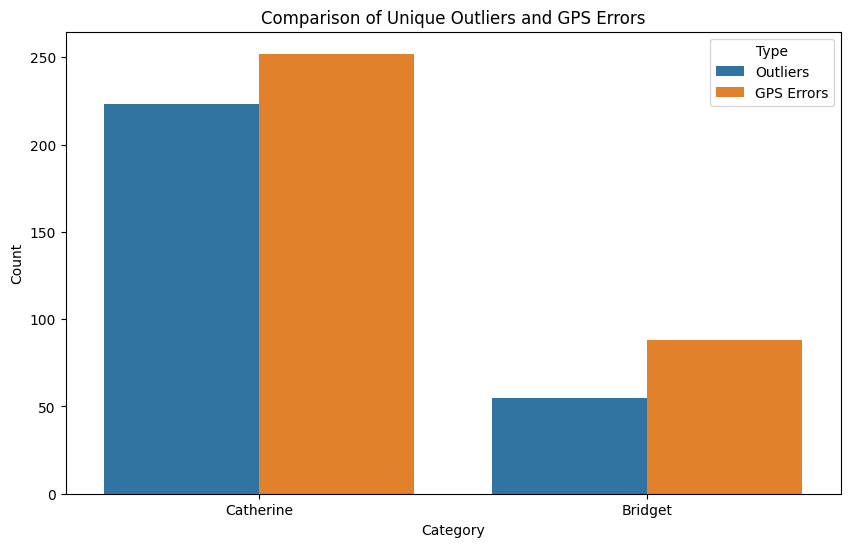

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

categories = ['Catherine', 'Bridget']
outliers_counts = [count_catherine_outliers, count_bridget_outliers]
gps_errors_counts = [count_gps_errors_catherine, count_gps_errors_bridget]

visualization_df = pd.DataFrame({
    'Category': categories * 2,
    'Count': outliers_counts + gps_errors_counts,
    'Type': ['Outliers'] * len(categories) + ['GPS Errors'] * len(categories)
})

plt.figure(figsize=(10, 6))
sns.barplot(x='Category', y='Count', hue='Type', data=visualization_df)
plt.title('Comparison of Unique Outliers and GPS Errors')
plt.xlabel('Category')
plt.ylabel('Count')
plt.legend(title='Type')
plt.show()


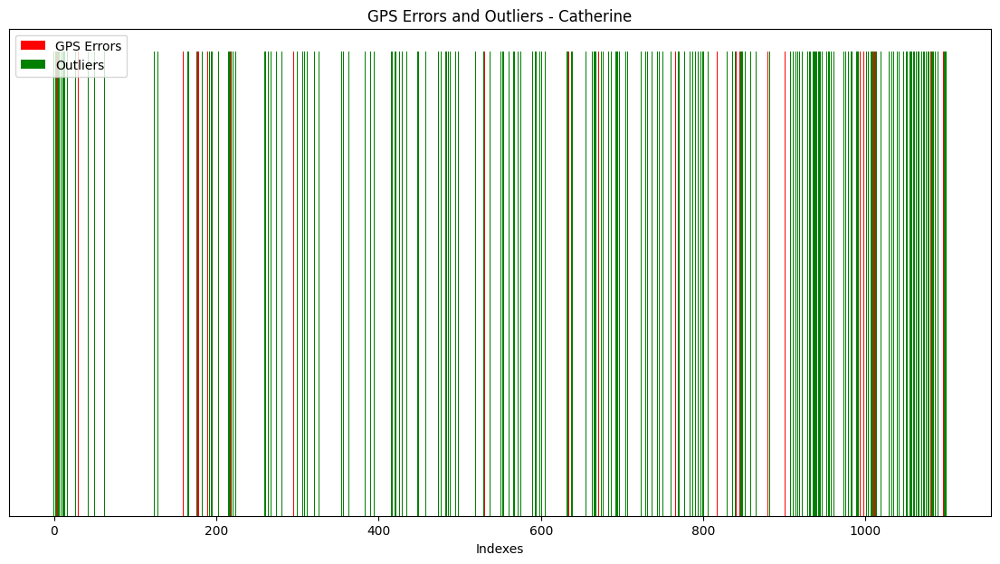

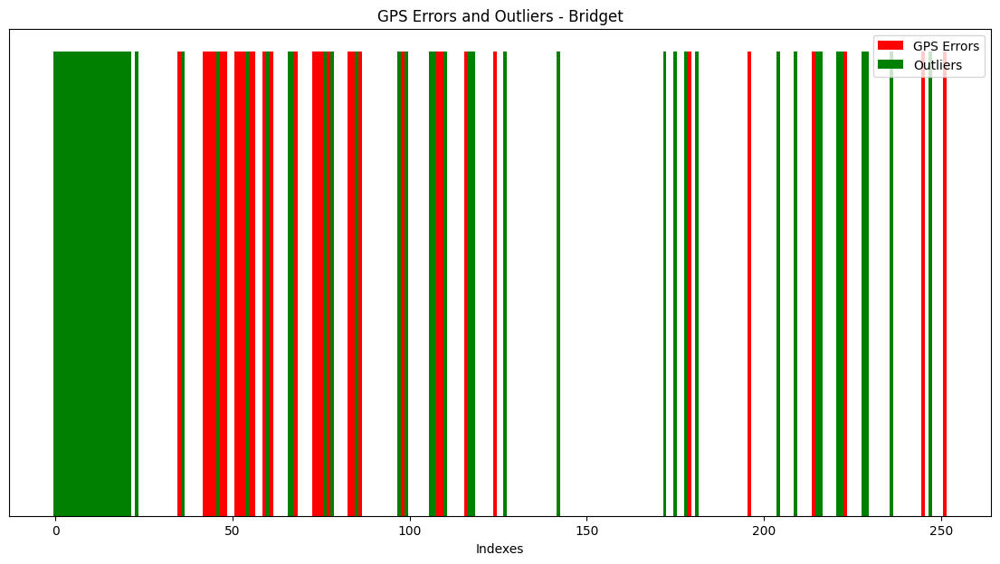

In [ ]:
def plot_gps_errors_and_outliers(gps_error_indexes, outliers_indexes, title):
    plt.figure(figsize=(14, 7))

    plt.bar(gps_error_indexes, [1] * len(gps_error_indexes), color='red', label='GPS Errors', width=1.0)

    plt.bar(list(outliers_indexes), [1] * len(outliers_indexes), color='green', label='Outliers', width=1.0)

    plt.xlabel('Indexes')
    plt.title(title)
    plt.yticks([])
    plt.legend()

    plt.show()

plot_gps_errors_and_outliers(gps_error_indexes_catherine, unique_outliers_indices_catherine, 'GPS Errors and Outliers - Catherine')
plot_gps_errors_and_outliers(gps_error_indexes_bridget, unique_outliers_indices_bridget, 'GPS Errors and Outliers - Bridget')

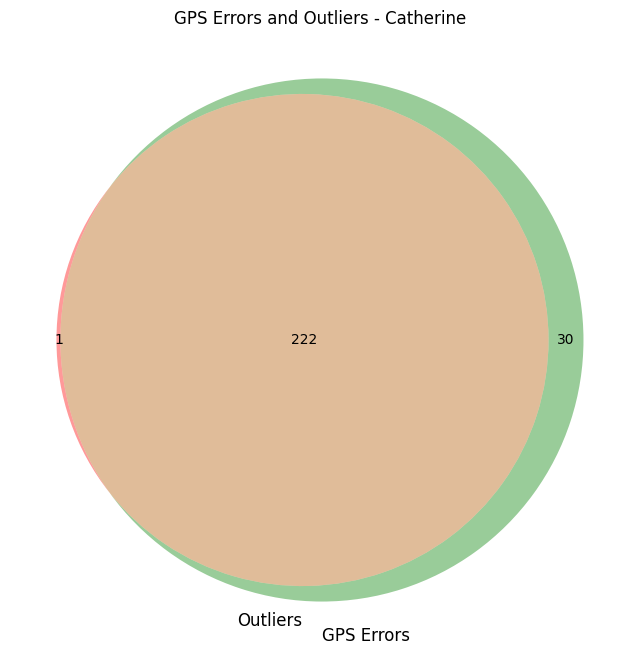

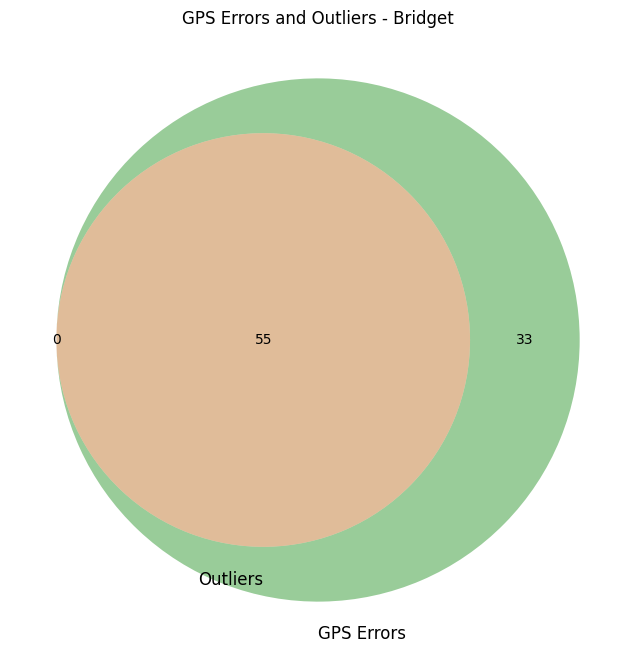

In [ ]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2

unique_outliers_indices_catherine = set(outliers_indices_catherine)
unique_gps_error_indexes_catherine = set(gps_error_indexes_catherine)

unique_outliers_indices_bridget = set(outliers_indices_bridget)
unique_gps_error_indexes_bridget = set(gps_error_indexes_bridget)

def plot_venn(outliers_indices, gps_error_indices, title):
    plt.figure(figsize=(8, 8))
    venn = venn2([outliers_indices, gps_error_indices], ('Outliers', 'GPS Errors'))
    plt.title(title)
    plt.show()

plot_venn(unique_outliers_indices_catherine, unique_gps_error_indexes_catherine, 'GPS Errors and Outliers - Catherine')
plot_venn(unique_outliers_indices_bridget, unique_gps_error_indexes_bridget, 'GPS Errors and Outliers - Bridget')

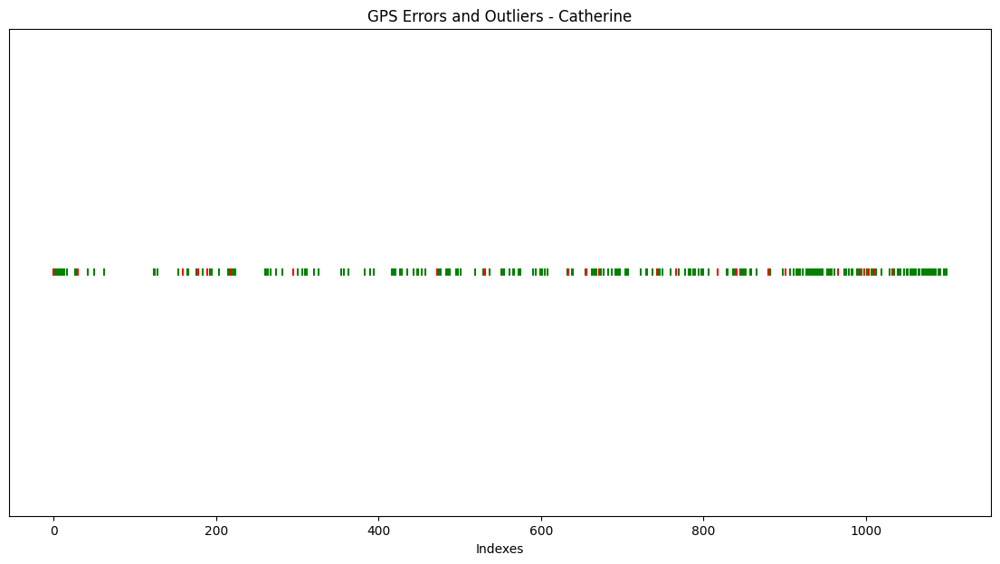

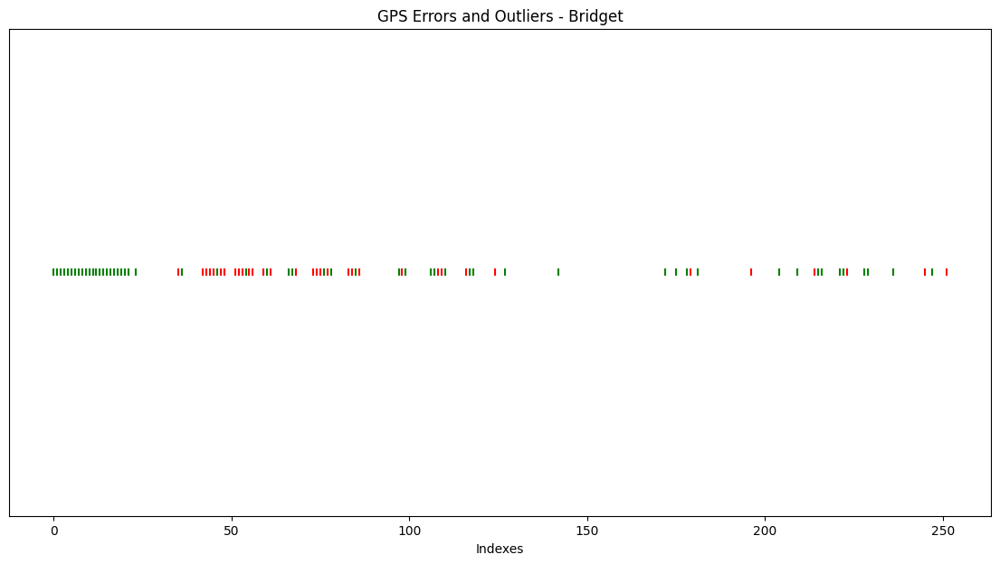

In [ ]:
import matplotlib.pyplot as plt

unique_outliers_indices_catherine = set(outliers_indices_catherine)
unique_gps_error_indexes_catherine = set(gps_error_indexes_catherine)

unique_outliers_indices_bridget = set(outliers_indices_bridget)
unique_gps_error_indexes_bridget = set(gps_error_indexes_bridget)

def plot_common_uncommon_indexes(outliers_indices, gps_error_indices, title):
    all_indices = sorted(outliers_indices.union(gps_error_indices))
    colors = ['green' if idx in outliers_indices and idx in gps_error_indices else 'red' for idx in all_indices]

    plt.figure(figsize=(14, 7))
    plt.scatter(all_indices, [1] * len(all_indices), c=colors, label='Indexes', marker='|')
    plt.xlabel('Indexes')
    plt.title(title)
    plt.yticks([])
    plt.show()

plot_common_uncommon_indexes(unique_outliers_indices_catherine, unique_gps_error_indexes_catherine, 'GPS Errors and Outliers - Catherine')

plot_common_uncommon_indexes(unique_outliers_indices_bridget, unique_gps_error_indexes_bridget, 'GPS Errors and Outliers - Bridget')


In [ ]:
merged_catherine_df_cleaned_gps = merged_catherine_df[merged_catherine_df['gps_errors'] == 'No Error'].copy()

merged_df_bridget_cleaned_gps = merged_df_bridget[merged_df_bridget['gps_errors'] == 'No Error'].copy()

print("Merged Catherine DataFrame (Cleaned):")
print(merged_catherine_df_cleaned_gps.head())

print("\nMerged Bridget DataFrame (Cleaned):")
print(merged_df_bridget_cleaned_gps.head())


Merged Catherine DataFrame (Cleaned):
                    GMT Time   Latitude   Longitude  Altitude  Duration  \
0  2023-02-08 10:00:00+00:00 -37.243271  143.624663    333.27        53   
1  2023-02-08 12:01:00+00:00 -37.243288  143.624550    347.22        62   
8  2023-03-08 14:01:00+00:00 -37.239982  143.623721     31.80        70   
10 2023-03-08 20:00:00+00:00 -37.244023  143.622744      0.43        70   
14 2023-04-08 14:01:00+00:00 -37.645540  143.859894      0.24        70   

    Temperature  Voltage  DOP  Satellites  Cause of Fix  ...    Year Month  \
0          18.0      4.1  1.4           5  GPS Schedule  ...  2023.0   2.0   
1          15.0      4.0  2.0           5  GPS Schedule  ...  2023.0   2.0   
8          15.5      3.9  4.6           4  GPS Schedule  ...  2023.0   3.0   
10         12.5      3.8  3.0           3  GPS Schedule  ...  2023.0   3.0   
14         30.5      3.9  6.0           3  GPS Schedule  ...  2023.0   4.0   

    Day  Maximum temperature (Degree C)  \

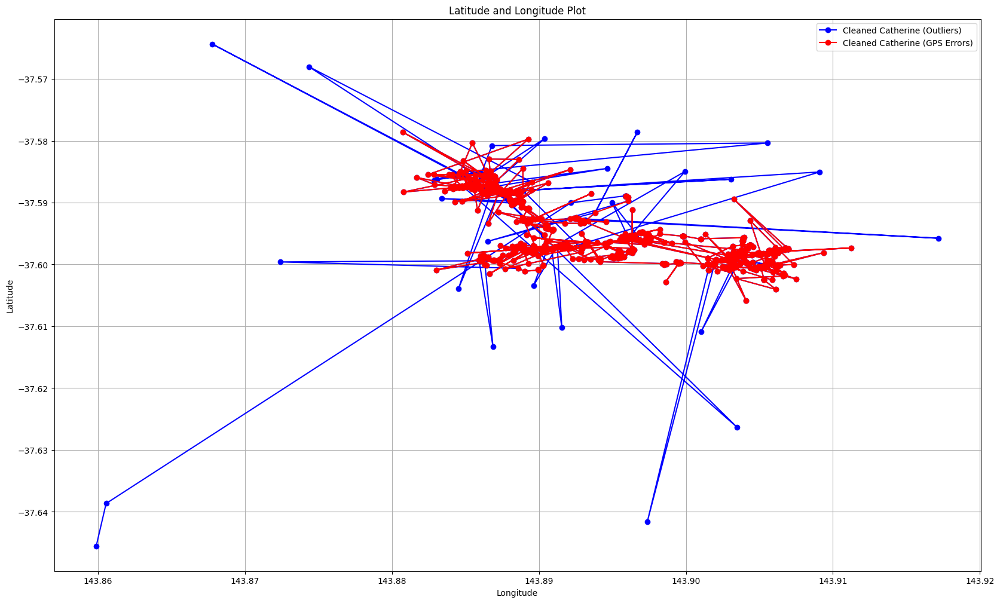

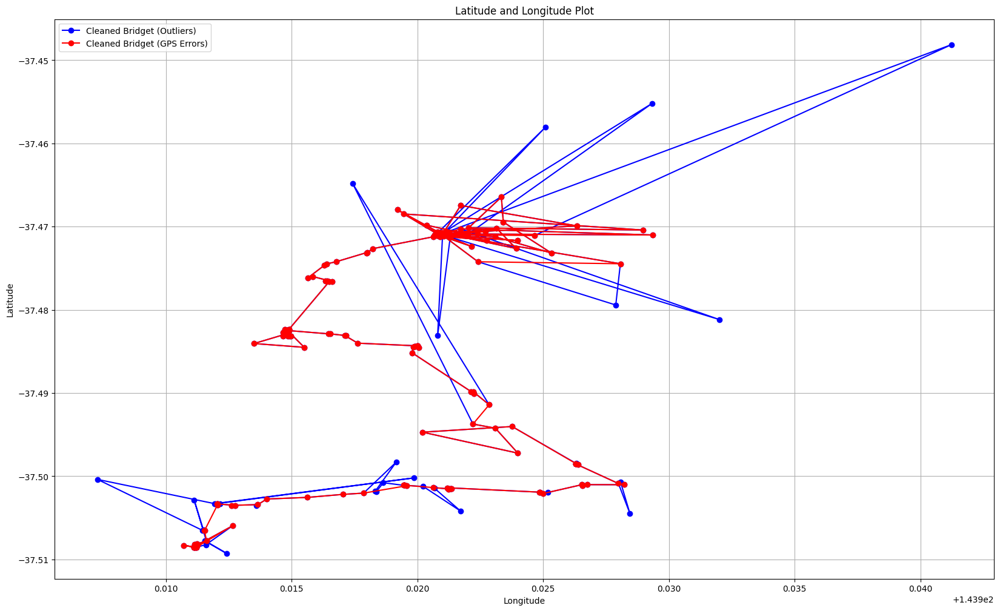

In [ ]:
import matplotlib.pyplot as plt

def plot_with_annotations(df, title, color):
    plt.plot(df['Longitude'], df['Latitude'], marker='o', linestyle='-', color=color, label=title)
    plt.title('Latitude and Longitude Plot')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.grid(True)

plt.figure(figsize=(20, 12))
plot_with_annotations(merged_catherine_df_cleaned, 'Cleaned Catherine (Outliers)', 'blue')
plot_with_annotations(merged_catherine_df_cleaned_gps, 'Cleaned Catherine (GPS Errors)', 'red')
plt.legend()
plt.show()

plt.figure(figsize=(20, 12))
plot_with_annotations(merged_df_bridget_cleaned, 'Cleaned Bridget (Outliers)', 'blue')
plot_with_annotations(merged_df_bridget_cleaned_gps, 'Cleaned Bridget (GPS Errors)', 'red')
plt.legend()
plt.show()

# Pickle

In [ ]:
'''import os

koala_folder = '/content/drive/My Drive/koala/'

os.makedirs(koala_folder, exist_ok=True)

merged_df_bridget_cleaned_gps.to_pickle(os.path.join(koala_folder, 'merged_df_bridget_cleaned_gps.pkl'))
merged_df_bridget_cleaned.to_pickle(os.path.join(koala_folder, 'merged_df_bridget_cleaned.pkl'))
merged_df_bridget.to_pickle(os.path.join(koala_folder, 'merged_df_bridget.pkl'))

merged_catherine_df_cleaned_gps.to_pickle(os.path.join(koala_folder, 'merged_catherine_df_cleaned_gps.pkl'))
merged_catherine_df_cleaned.to_pickle(os.path.join(koala_folder, 'merged_catherine_df_cleaned.pkl'))
merged_catherine_df.to_pickle(os.path.join(koala_folder, 'merged_catherine_df.pkl'))

print("DataFrames have been successfully saved as pickle files in the 'koala' folder on your Google Drive.")
'''

DataFrames have been successfully saved as pickle files in the 'koala' folder on your Google Drive.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import pandas as pd



koala_folder = '/content/drive/My Drive/koala/'

os.makedirs(koala_folder, exist_ok=True)

merged_df_bridget_cleaned_gps = pd.read_pickle(os.path.join(koala_folder, 'merged_df_bridget_cleaned_gps.pkl'))
merged_df_bridget_cleaned = pd.read_pickle(os.path.join(koala_folder, 'merged_df_bridget_cleaned.pkl'))
merged_df_bridget = pd.read_pickle(os.path.join(koala_folder, 'merged_df_bridget.pkl'))

merged_catherine_df_cleaned_gps = pd.read_pickle(os.path.join(koala_folder, 'merged_catherine_df_cleaned_gps.pkl'))
merged_catherine_df_cleaned = pd.read_pickle(os.path.join(koala_folder, 'merged_catherine_df_cleaned.pkl'))
merged_catherine_df = pd.read_pickle(os.path.join(koala_folder, 'merged_catherine_df.pkl'))

print("Bridget Cleaned GPS DataFrame:")
print(merged_df_bridget_cleaned_gps.head())

print("\nBridget Cleaned DataFrame:")
print(merged_df_bridget_cleaned.head())

print("\nBridget DataFrame:")
print(merged_df_bridget.head())

print("\nCatherine Cleaned GPS DataFrame:")
print(merged_catherine_df_cleaned_gps.head())

print("\nCatherine Cleaned DataFrame:")
print(merged_catherine_df_cleaned.head())

print("\nCatherine DataFrame:")
print(merged_catherine_df.head())

Bridget Cleaned GPS DataFrame:
                          Date Month_x         Time   Latitude   Longitude  \
Timestamp                                                                    
2024-02-06 14:00:35  6/02/2024     Feb   3:00:35 AM -37.508558  143.911156   
2024-02-06 20:00:33  6/02/2024     Feb   9:00:33 AM -37.508474  143.911111   
2024-02-06 22:00:36  6/02/2024     Feb  11:00:36 AM -37.508502  143.911155   
2024-02-07 00:00:36  6/02/2024     Feb   1:00:36 PM -37.508539  143.911101   
2024-02-07 04:00:57  6/02/2024     Feb   5:00:57 PM -37.508462  143.911145   

                     Altitude  Duration  Temperature  Voltage  DOP  ...  Year  \
Timestamp                                                           ...         
2024-02-06 14:00:35    591.84        34         29.0      3.8  1.2  ...  2024   
2024-02-06 20:00:33    599.17        33         37.5      3.8  1.4  ...  2024   
2024-02-06 22:00:36    593.37        35         28.0      3.8  0.8  ...  2024   
2024-02-07 00:00:

# Task 11

In [ ]:
!pip install rasterio

In [ ]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
import pandas as pd
from pyproj import Proj, transform
import datetime
import numpy as np


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
from pyproj import Proj, transform

tif_file_path_south = '/content/drive/MyDrive/koala/Vegetation maps-20240519/BALLARAT-SOUTH_20cm_Vicgrid2020.tif'
tif_file_path_north = '/content/drive/MyDrive/koala/Vegetation maps-20240519/BALLARAT-NORTH_20cm_Vicgrid2020.tif'

with rasterio.open(tif_file_path_south) as src_south:
    tif_crs = Proj(src_south.crs)

gps_crs = Proj(init='epsg:4326')
def convert_coords(lon, lat):
    x, y = transform(gps_crs, tif_crs, lon, lat)
    return x, y

def convert_dataframe_coords(df):
    df['X'], df['Y'] = zip(*df.apply(lambda row: convert_coords(row['Longitude'], row['Latitude']), axis=1))
    return df

merged_catherine_df_cleaned_gps = convert_dataframe_coords(merged_catherine_df_cleaned_gps)
merged_df_bridget_cleaned_gps = convert_dataframe_coords(merged_df_bridget_cleaned_gps)


/usr/local/lib/python3.10/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
<ipython-input-30-117dd6efb2dc>:19: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x, y = transform(gps_crs, tif_crs, lon, lat)
<ipython-input-30-117dd6efb2dc>:19: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  x, y = transform(gps_crs, tif_crs, lon, lat)


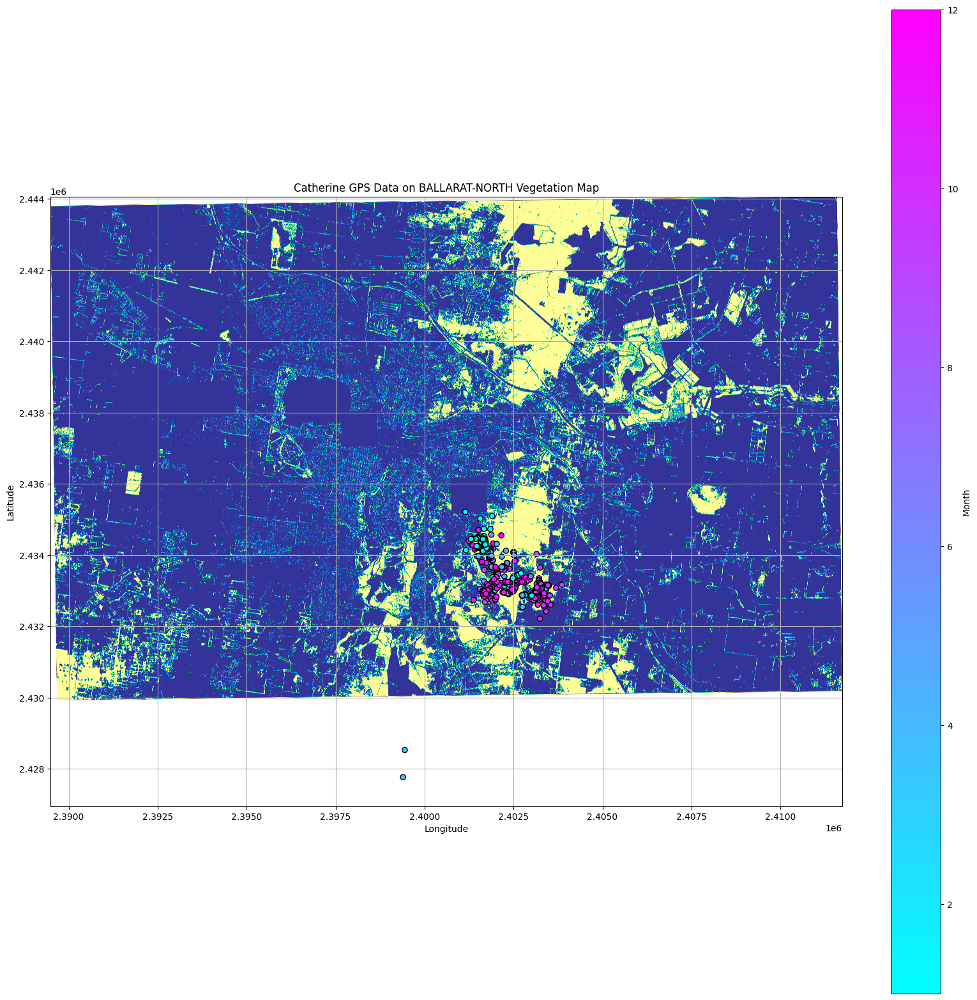

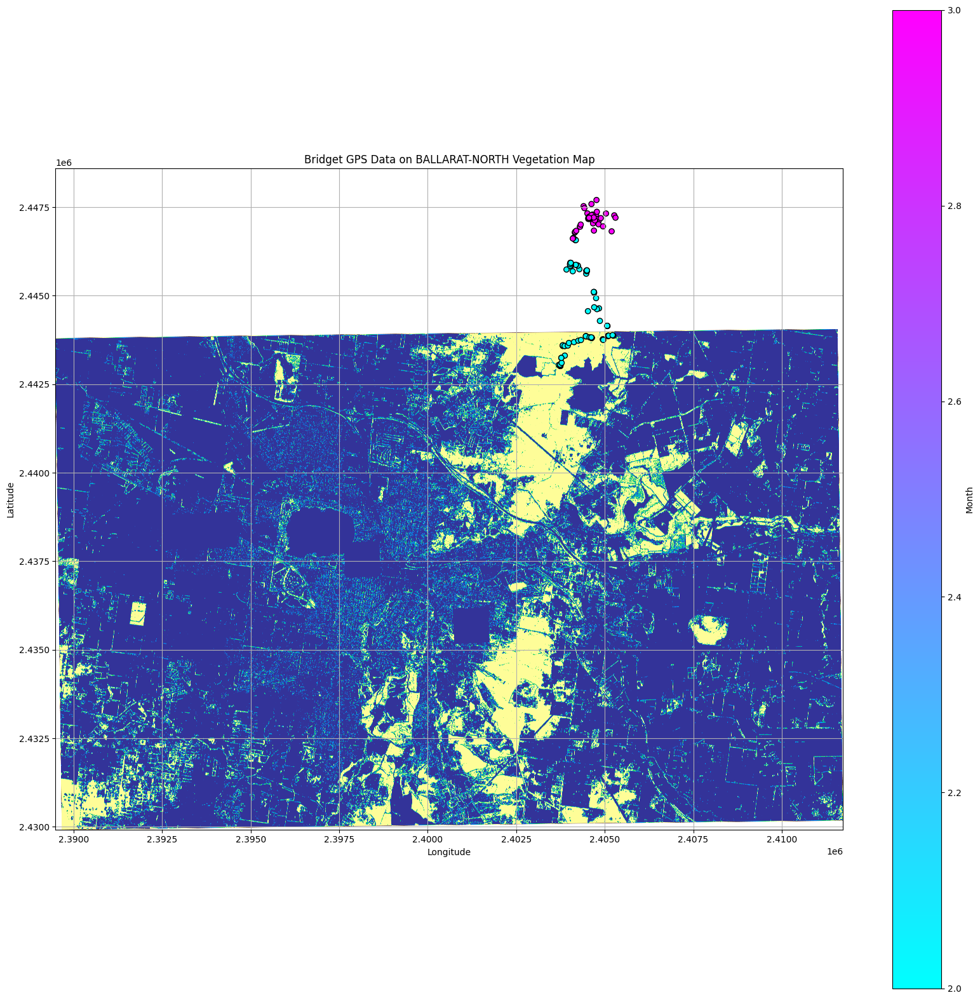

In [ ]:
def plot_gps_on_tiff(df, src, title):
    with rasterio.open(src) as src:
        data_downsampled = src.read(
            out_shape=(
                src.count,
                int(src.height // 4),
                int(src.width // 4)
            ),
            resampling=rasterio.enums.Resampling.average
        )
        transform = src.transform * src.transform.scale(
            (src.width / data_downsampled.shape[-1]),
            (src.height / data_downsampled.shape[-2])
        )
        fig, ax = plt.subplots(figsize=(20, 20))
        show(data_downsampled[0], transform=transform, cmap='terrain', ax=ax)
        scatter = ax.scatter(df['X'], df['Y'], c=df['AEST Time'].apply(lambda x: x.month), cmap='cool', edgecolor='k')
        plt.title(title)
        plt.colorbar(scatter, ax=ax, label='Month')
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.grid(True)
        plt.show()

merged_catherine_df_cleaned_gps['AEST Time'] = pd.to_datetime(merged_catherine_df_cleaned_gps['AEST Time'])
merged_df_bridget_cleaned_gps['AEST Time'] = pd.to_datetime(merged_df_bridget_cleaned_gps['AEST Time'])

plot_gps_on_tiff(merged_catherine_df_cleaned_gps, tif_file_path_north, 'Catherine GPS Data on BALLARAT-NORTH Vegetation Map')
plot_gps_on_tiff(merged_df_bridget_cleaned_gps, tif_file_path_north, 'Bridget GPS Data on BALLARAT-NORTH Vegetation Map')


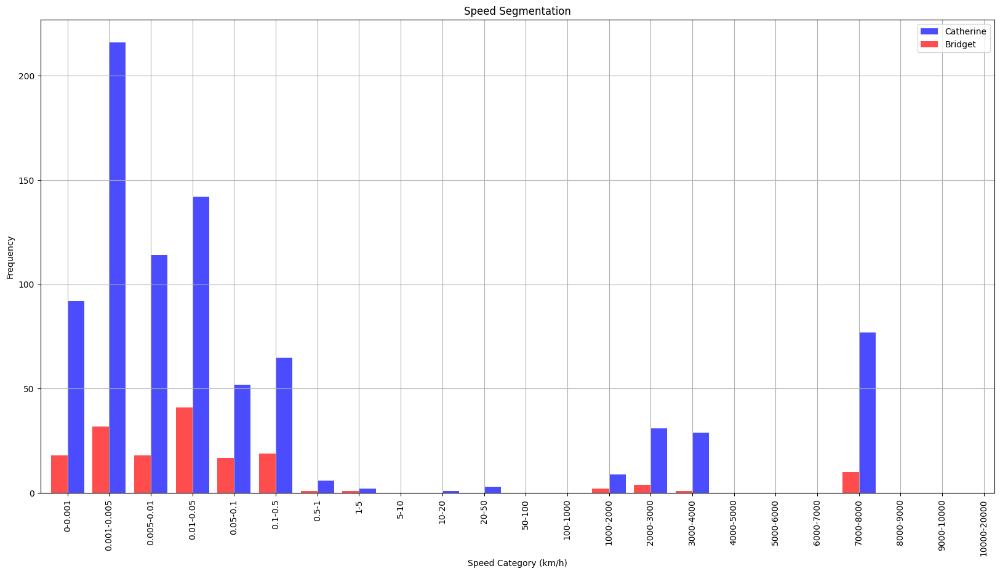

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

speed_bins = [0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 20, 50, 100, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 20000]
speed_labels = ['0-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.05', '0.05-0.1', '0.1-0.5', '0.5-1', '1-5', '5-10', '10-20', '20-50', '50-100', '100-1000', '1000-2000', '2000-3000', '3000-4000', '4000-5000', '5000-6000', '6000-7000', '7000-8000', '8000-9000', '9000-10000', '10000-20000']

merged_catherine_df_cleaned_gps['Speed_Category'] = pd.cut(merged_catherine_df_cleaned_gps['Speed'], bins=speed_bins, labels=speed_labels)
merged_df_bridget_cleaned_gps['Speed_Category'] = pd.cut(merged_df_bridget_cleaned_gps['Speed'], bins=speed_bins, labels=speed_labels)

plt.figure(figsize=(20, 10))
merged_catherine_df_cleaned_gps['Speed_Category'].value_counts().sort_index().plot(kind='bar', color='blue', alpha=0.7, label='Catherine', width=0.4, position=0)
merged_df_bridget_cleaned_gps['Speed_Category'].value_counts().sort_index().plot(kind='bar', color='red', alpha=0.7, label='Bridget', width=0.4, position=1)

plt.title('Speed Segmentation')
plt.xlabel('Speed Category (km/h)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.show()


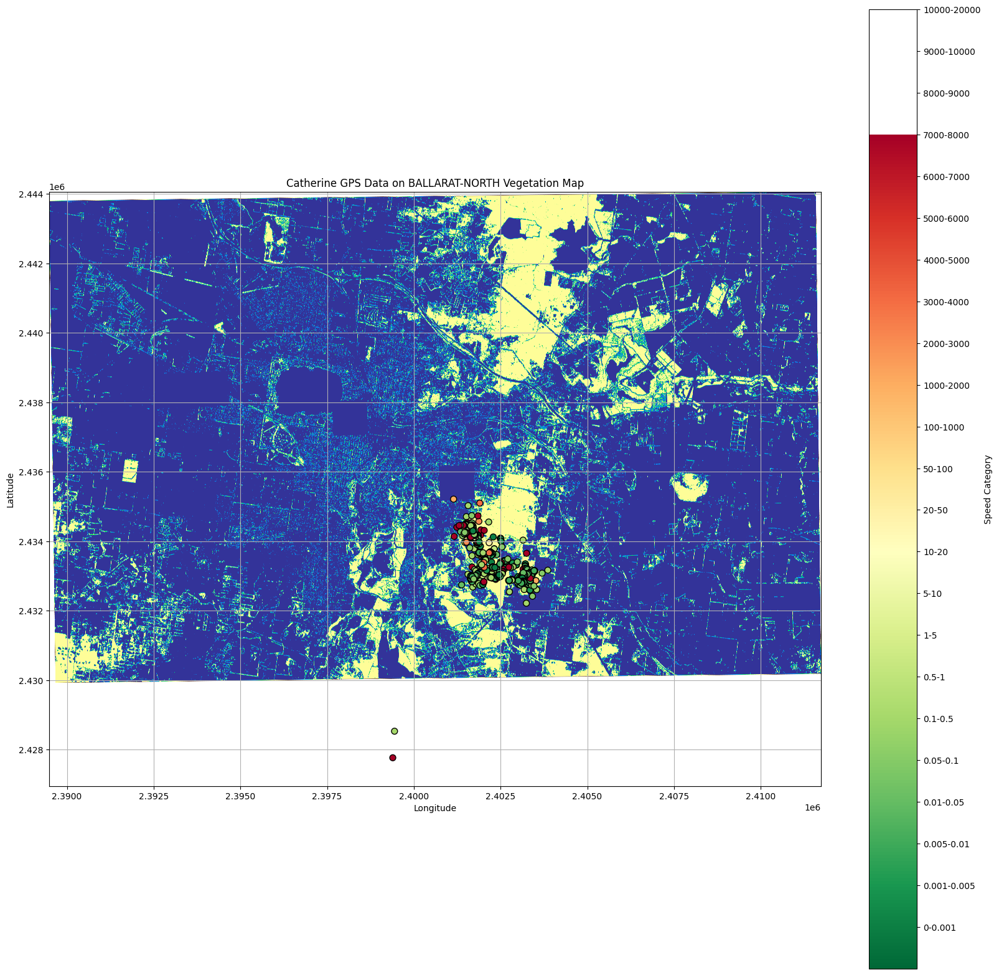

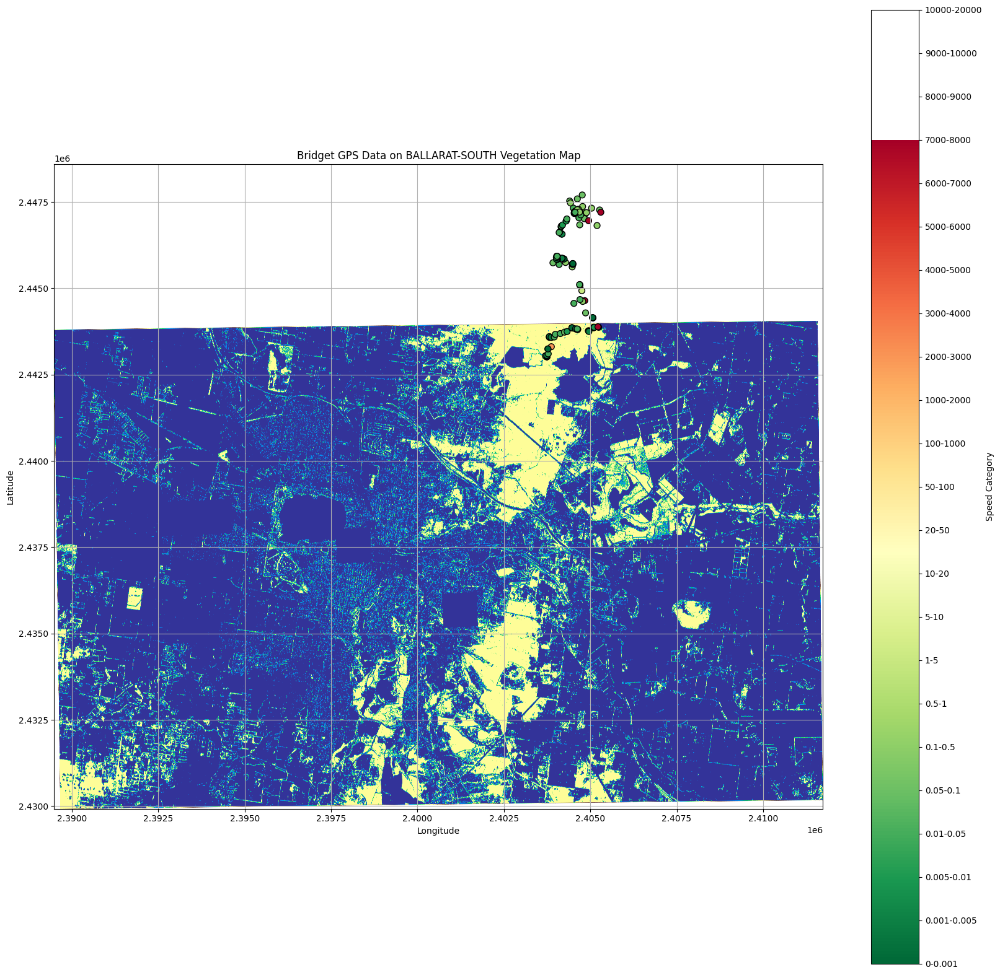

In [ ]:
speed_bins = [0, 0.001, 0.005, 0.01, 0.05, 0.1, 0.5, 1, 5, 10, 20, 50, 100, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 20000]
speed_labels = ['0-0.001', '0.001-0.005', '0.005-0.01', '0.01-0.05', '0.05-0.1', '0.1-0.5', '0.5-1', '1-5', '5-10', '10-20', '20-50', '50-100', '100-1000', '1000-2000', '2000-3000', '3000-4000', '4000-5000', '5000-6000', '6000-7000', '7000-8000', '8000-9000', '9000-10000', '10000-20000']

merged_catherine_df_cleaned_gps['Speed_Category'] = pd.cut(merged_catherine_df_cleaned_gps['Speed'], bins=speed_bins, labels=speed_labels)
merged_df_bridget_cleaned_gps['Speed_Category'] = pd.cut(merged_df_bridget_cleaned_gps['Speed'], bins=speed_bins, labels=speed_labels)

def plot_gps_on_tiff(df, src, title):
    with rasterio.open(src) as src:
        data_downsampled = src.read(
            out_shape=(
                src.count,
                int(src.height // 4),
                int(src.width // 4)
            ),
            resampling=rasterio.enums.Resampling.average
        )
        transform = src.transform * src.transform.scale(
            (src.width / data_downsampled.shape[-1]),
            (src.height / data_downsampled.shape[-2])
        )
        fig, ax = plt.subplots(figsize=(20, 20))
        show(data_downsampled[0], transform=transform, cmap='terrain', ax=ax)
        scatter = ax.scatter(df['X'], df['Y'], c=df['Speed_Category'].cat.codes, cmap='RdYlGn_r', edgecolor='k', s=50)
        plt.title(title)
        cbar = plt.colorbar(scatter, ax=ax, label='Speed Category')
        cbar.set_ticks(range(len(speed_labels)))
        cbar.set_ticklabels(speed_labels)
        plt.xlabel('Longitude')
        plt.ylabel('Latitude')
        plt.grid(True)
        plt.show()

merged_catherine_df_cleaned_gps['AEST Time'] = pd.to_datetime(merged_catherine_df_cleaned_gps['AEST Time'])
merged_df_bridget_cleaned_gps['AEST Time'] = pd.to_datetime(merged_df_bridget_cleaned_gps['AEST Time'])

plot_gps_on_tiff(merged_catherine_df_cleaned_gps, tif_file_path_north, 'Catherine GPS Data on BALLARAT-NORTH Vegetation Map')
plot_gps_on_tiff(merged_df_bridget_cleaned_gps, tif_file_path_north, 'Bridget GPS Data on BALLARAT-SOUTH Vegetation Map')


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Model Development (Regression)**

 **Task 12:** Choose the variables/attributes you believe will offer most predictive power in a regression model, and also a classification model. Develop the models using python code. Pay attention to how you divide your data, for training and evaluation.

In [ ]:
print("merged_catherine_df_cleaned_gps:")
print(merged_catherine_df_cleaned_gps.columns)

print("merged_df_bridget_cleaned_gps:")
print(merged_df_bridget_cleaned_gps.columns)

merged_catherine_df_cleaned_gps:
Index(['GMT Time', 'Latitude', 'Longitude', 'Altitude', 'Duration',
       'Temperature', 'Voltage', 'DOP', 'Satellites', 'Cause of Fix',
       'AEST Time', 'date', 'Product code_x',
       'Bureau of Meteorology station number_x', 'Year_x', 'Month_x', 'Day_x',
       'Rainfall amount (millimetres)',
       'Period over which rainfall was measured (days)', 'Quality_x',
       'Product code_y', 'Bureau of Meteorology station number_y', 'Year_y',
       'Month_y', 'Day_y', 'Daily global solar exposure (MJ/m*m)',
       'Product code', 'Bureau of Meteorology station number', 'Year', 'Month',
       'Day', 'Maximum temperature (Degree C)',
       'Days of accumulation of maximum temperature', 'Quality_y',
       'DistanceTravelled', 'Speed', 'Bearing', 'gps_errors'],
      dtype='object')
merged_df_bridget_cleaned_gps:
Index(['Date', 'Month_x', 'Time', 'Latitude', 'Longitude', 'Altitude',
       'Duration', 'Temperature', 'Voltage', 'DOP', 'Satellites',
  

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error

Attributes which Have predictive power on the model:

In [ ]:
columns_to_keep = [
    'Latitude', 'Longitude', 'Altitude', 'Temperature',
    'Rainfall amount (millimetres)', 'Daily global solar exposure (MJ/m*m)',
    'Maximum temperature (Degree C)', 'AEST Time', 'Speed',
    'DOP', 'DistanceTravelled', 'Bearing'
]

df_catherine_relevant = merged_catherine_df_cleaned_gps[columns_to_keep]
df_bridget_relevant = merged_df_bridget_cleaned_gps[columns_to_keep]


In [ ]:
df = pd.concat([df_catherine_relevant, df_bridget_relevant], ignore_index=True)


In [ ]:
df


,Latitude,Longitude,Altitude,Temperature,Rainfall amount (millimetres),Daily global solar exposure (MJ/m*m),Maximum temperature (Degree C),AEST Time,Speed,DOP,DistanceTravelled,Bearing
0,-37.645540,143.859894,0.24,30.5,2.2,10.6,12.1,2023-04-09 00:01:00,7219.203405,6.0,14438.406809,142.599794
1,-37.638655,143.860567,31.62,23.0,2.2,10.6,12.1,2023-04-09 04:01:00,0.191638,2.2,0.766554,4.421716
2,-37.590026,143.892180,107.65,21.0,1.6,6.5,11.4,2023-05-08 14:01:00,20.517837,3.2,14444.556901,142.565731
3,-37.588910,143.895861,512.78,24.0,1.6,6.5,11.4,2023-05-08 20:00:00,0.058146,1.8,0.347906,69.070101
4,-37.588932,143.895914,522.78,36.5,1.6,6.5,11.4,2023-05-08 22:00:00,0.002645,1.4,0.005291,117.042624
...,...,...,...,...,...,...,...,...,...,...,...,...
1006,-37.470263,143.921717,-0.34,30.0,0.2,13.0,22.0,2024-03-14 14:00:36,0.189354,2.8,1.513043,323.173278
1007,-37.471002,143.929347,-0.51,14.5,0.2,13.0,22.0,2024-03-14 22:01:07,7230.802303,6.2,14455.578937,142.471384
1008,-37.470891,143.922386,112.57,14.5,0.0,19.3,NaN,2024-03-15 00:01:08,0.307921,2.4,0.615927,271.149865
1009,-37.470948,143.920907,569.53,15.5,0.0,19.3,NaN,2024-03-15 04:01:08,0.032730,3.0,0.130922,267.227930


In [ ]:
df['AEST Time'] = pd.to_datetime(df['AEST Time'], infer_datetime_format=True)

df['Hour'] = df['AEST Time'].dt.hour
df['Month'] = df['AEST Time'].dt.month

<ipython-input-42-54a929bdbf4f>:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['AEST Time'] = pd.to_datetime(df['AEST Time'], infer_datetime_format=True)


In [ ]:
null_counts = df.isnull().sum()
print(null_counts)

Latitude                                 0
Longitude                                0
Altitude                                 0
Temperature                              0
Rainfall amount (millimetres)           34
Daily global solar exposure (MJ/m*m)    28
Maximum temperature (Degree C)          34
AEST Time                                0
Speed                                    0
DOP                                      0
DistanceTravelled                        0
Bearing                                  0
Hour                                     0
Month                                    0
dtype: int64


In [ ]:
df.fillna(df.mean(), inplace=True)


In [ ]:
null_counts = df.isnull().sum()
print(null_counts)

Latitude                                0
Longitude                               0
Altitude                                0
Temperature                             0
Rainfall amount (millimetres)           0
Daily global solar exposure (MJ/m*m)    0
Maximum temperature (Degree C)          0
AEST Time                               0
Speed                                   0
DOP                                     0
DistanceTravelled                       0
Bearing                                 0
Hour                                    0
Month                                   0
dtype: int64


In [ ]:
import pandas as pd

df['previous_location'] = df[['Longitude', 'Latitude']].shift(1).apply(tuple, axis=1)
df['next_location'] = df[['Longitude', 'Latitude']].shift(-1).apply(tuple, axis=1)

df['previous_location'].iloc[0] = (df['Longitude'].iloc[0], df['Latitude'].iloc[0])
df['next_location'].iloc[-1] = (df['Longitude'].iloc[-1], df['Latitude'].iloc[-1])

df[['previous_longitude', 'previous_latitude']] = pd.DataFrame(df['previous_location'].tolist(), index=df.index)
df[['next_longitude', 'next_latitude']] = pd.DataFrame(df['next_location'].tolist(), index=df.index)

df.drop(['previous_location', 'next_location'], axis=1, inplace=True)


<ipython-input-46-35dabdbcba30>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['previous_location'].iloc[0] = (df['Longitude'].iloc[0], df['Latitude'].iloc[0])
<ipython-input-46-35dabdbcba30>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['next_location'].iloc[-1] = (df['Longitude'].iloc[-1], df['Latitude'].iloc[-1])


In [ ]:
df.to_csv('asdfs.csv')

In [ ]:
df.columns

Index(['Latitude', 'Longitude', 'Altitude', 'Temperature',
       'Rainfall amount (millimetres)', 'Daily global solar exposure (MJ/m*m)',
       'Maximum temperature (Degree C)', 'AEST Time', 'Speed', 'DOP',
       'DistanceTravelled', 'Bearing', 'Hour', 'Month', 'previous_longitude',
       'previous_latitude', 'next_longitude', 'next_latitude'],
      dtype='object')

**Model development and Hyperparameter Tuning**


In [ ]:
features = [
    'Latitude', 'Longitude', 'Altitude', 'Temperature', 'Rainfall amount (millimetres)',
    'Daily global solar exposure (MJ/m*m)', 'Maximum temperature (Degree C)',
    'DOP', 'Bearing', 'Hour', 'Month', 'previous_longitude', 'previous_latitude'
]
target_speed = 'Speed'
target_distance = 'DistanceTravelled'
target_next_location = ['next_longitude', 'next_latitude']

X = df[features]
y_speed = df[target_speed]
y_distance = df[target_distance]
y_next_location = df[target_next_location]

# Split data into training and testing sets for speed and distance prediction
X_train, X_test, y_train_speed, y_test_speed, y_train_distance, y_test_distance = train_test_split(
    X, y_speed, y_distance, test_size=0.3, random_state=42)

# Split data into training and testing sets for next location prediction
_, _, y_train_next_location, y_test_next_location = train_test_split(
    X, y_next_location, test_size=0.3, random_state=42)

preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['Latitude', 'Longitude', 'Altitude', 'Temperature',
                                   'Rainfall amount (millimetres)', 'Daily global solar exposure (MJ/m*m)',
                                   'Maximum temperature (Degree C)', 'DOP', 'Bearing',
                                   'previous_longitude', 'previous_latitude']),
        ('cat', OneHotEncoder(), ['Hour', 'Month'])
    ]
)

# pipeline
speed_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

distance_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

trajectory_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])



# **Model Evaluation (Regression)**

 **Task 13.**	Explain the following terms: R2 (R squared) coefficient of determination, mean squared error, sum of squares error, Residual Plot, F1 score, ROC curve, Confusion matrix, cross validation.

1. **R2 (R squared) Coefficient of Determination**: Indicates the proportion of the variance in the dependent variable explained by the independent variables. Ranges from 0 to 1, where 1 means perfect prediction.

2. **Mean Squared Error (MSE)**: The average of the squared differences between predicted and actual values. Lower MSE indicates a better fit.

3. **Sum of Squares Error (SSE)**: The total of the squared differences between observed and predicted values. Used to measure model error.

4. **Residual Plot**: A graph showing residuals (errors) on the y-axis and predicted values or independent variable on the x-axis. Used to diagnose the fit of a regression model.

5. **F1 Score**:The harmonic mean of precision and recall. Used in binary classification to measure accuracy, balancing precision and recall.

6. **ROC Curve**:A plot of true positive rate against false positive rate for different threshold settings. Used to evaluate the diagnostic ability of a binary classifier.

7. **Confusion Matrix**:A table showing true positives, false positives, true negatives, and false negatives. Used to evaluate the performance of a classification model.
8. **Cross Validation**:A technique to assess the generalizability of a model by splitting data into training and validation sets multiple times. Commonly used is k-fold cross-validation.


### **Task 14:** Evaluate your models using whichever techniques you think are most appropriate, and, explain why you chose them.


**Why These Techniques Were Chosen:**

**R² Score:** Measures how well the model explains the variance in the data.
It also provides a clear understanding of the model's explanatory power for speed, distance traveled, and location prediction.

**Mean Squared Error (MSE):** Quantifies the average squared error, penalizing larger errors more. And helps in understanding the average prediction error, which is crucial for tracking precise movements and behaviors.

**Sum of Squares Error (SSE):** Measures the total error across all predictions.
Besides it provides an aggregate measure of prediction accuracy, which is essential for evaluating overall model performance.

(R2, MSE and SSE were chosen to evaluate)

**Why These Techniques Were Chosen:**

**R2 Score:**

Reason: Measures how well the model explains the variance in the data.

Appropriate for Koala Data: Provides a clear understanding of the model's explanatory power for speed, distance traveled, and location prediction.

**Mean Squared Error (MSE):**

Reason: Quantifies the average squared error, penalizing larger errors more.
Appropriate for Koala Data: Helps in understanding the average prediction error, which is crucial for tracking precise movements and behaviors.

**Sum of Squares Error (SSE):**

Reason: Measures the total error across all predictions.

Appropriate for Koala Data: Provides an aggregate measure of prediction accuracy, which is essential for evaluating overall model performance.

**Evaluation**

In [ ]:
best_speed_model = grid_search_speed.best_estimator_
best_distance_model = grid_search_distance.best_estimator_
best_trajectory_model = grid_search_trajectory.best_estimator_

# Speed model
train_r2_speed = best_speed_model.score(X_train, y_train_speed)
test_r2_speed = best_speed_model.score(X_test, y_test_speed)
train_mse_speed = mean_squared_error(y_train_speed, best_speed_model.predict(X_train))
test_mse_speed = mean_squared_error(y_test_speed, best_speed_model.predict(X_test))
train_sse_speed = np.sum((y_train_speed - best_speed_model.predict(X_train)) ** 2)
test_sse_speed = np.sum((y_test_speed - best_speed_model.predict(X_test)) ** 2)

# Distance model
train_r2_distance = best_distance_model.score(X_train, y_train_distance)
test_r2_distance = best_distance_model.score(X_test, y_test_distance)
train_mse_distance = mean_squared_error(y_train_distance, best_distance_model.predict(X_train))
test_mse_distance = mean_squared_error(y_test_distance, best_distance_model.predict(X_test))
train_sse_distance = np.sum((y_train_distance - best_distance_model.predict(X_train)) ** 2)
test_sse_distance = np.sum((y_test_distance - best_distance_model.predict(X_test)) ** 2)

# Trajectory model
train_r2_next_location = best_trajectory_model.score(X_train, y_train_next_location)
test_r2_next_location = best_trajectory_model.score(X_test, y_test_next_location)
train_mse_next_location = mean_squared_error(y_train_next_location, best_trajectory_model.predict(X_train))
test_mse_next_location = mean_squared_error(y_test_next_location, best_trajectory_model.predict(X_test))
train_sse_next_location = np.sum((y_train_next_location - best_trajectory_model.predict(X_train)) ** 2)
test_sse_next_location = np.sum((y_test_next_location - best_trajectory_model.predict(X_test)) ** 2)

print('Model Performance:')
print('------')
print('Speed Prediction:')
print(f'Training R²: {train_r2_speed}, Testing R²: {test_r2_speed}')
print(f'Training MSE: {train_mse_speed}, Testing MSE: {test_mse_speed}')
print(f'Training SSE: {train_sse_speed}, Testing SSE: {test_sse_speed}')
print('------')
print('Distance Travelled Prediction:')
print(f'Training R²: {train_r2_distance}, Testing R²: {test_r2_distance}')
print(f'Training MSE: {train_mse_distance}, Testing MSE: {test_mse_distance}')
print(f'Training SSE: {train_sse_distance}, Testing SSE: {test_sse_distance}')
print('------')
print('Next Location Prediction:')
print(f'Training R²: {train_r2_next_location}, Testing R²: {test_r2_next_location}')
print(f'Training MSE: {train_mse_next_location}, Testing MSE: {test_mse_next_location}')
print(f'Training SSE: {train_sse_next_location}, Testing SSE: {test_sse_next_location}')


Model Performance:
------
Speed Prediction:
Training R²: 0.9975669712453619, Testing R²: 0.9618410388707379
Training MSE: 10399.535047613714, Testing MSE: 184724.61302671442
Training SSE: 7352471.278662896, Testing SSE: 56156282.36012118
------
Distance Travelled Prediction:
Training R²: 0.9999805310001513, Testing R²: 0.9999999936777392
Training MSE: 561.0354895522545, Testing MSE: 0.18129167039093197
Training SSE: 396652.09111344395, Testing SSE: 55.11266779884332
------
Next Location Prediction:
Training R²: 0.9975678211922604, Testing R²: 0.9765620198443733
Training MSE: 1.043831978939883e-06, Testing MSE: 1.2960045994288296e-05
Training SSE: next_longitude    0.000385
next_latitude     0.001091
dtype: float64, Testing SSE: next_longitude    0.001316
next_latitude     0.006563
dtype: float64


### **Task 15:** What do you results show? Include in your answer the following ideas. What does overfitting and underfitting mean? What can you say about your model in terms of Overfitting or Underfitting? How might you use Ridge Regression or Grid Search to reduce the amount of overfitting?

**Overfitting Or Underfitting:**

- Overfitting means the model memorizes quirks of the training data, hurting its ability to predict on new data. Imagine a curve fit too perfectly to random noise in the data.

- Underfitting is when the model is too simple to capture the relationship between variables, leading to poor performance on all data. Think of a straight line trying to fit a curvy pattern.

**Regession Model:**

1. **Speed Prediction Model**:
    - The training R2 is very high (close to 1), indicating that the model fits the training data well.
    - However, there is a notable drop in R2 for the testing dataset, suggesting that the model's performance is not as good on unseen data.
    - Additionally, the testing MSE and SSE are significantly higher than those of the training dataset, indicating that the model might be overfitting to the training data.
    
2. **Distance Travelled Prediction Model**:
    - Both the training and testing R2 values are very high (close to 1), indicating that the model fits the data well for both datasets.
    - The MSE and SSE values are low for both training and testing datasets, indicating good model performance with minimal discrepancy between training and testing metrics. There are no significant signs of overfitting or underfitting.
    
3. **Next Location Prediction Model**:
    - Similar to the Speed Prediction Model, there is a drop in R2 for the testing dataset compared to the training dataset, indicating potential overfitting.
    - The MSE and SSE values for the testing dataset are higher than those for the training dataset, further suggesting overfitting.

In summary:
- The Speed Prediction and Next Location Prediction models show signs of overfitting, primarily evidenced by the notable discrepancy between training and testing performance metrics, particularly in terms of R2, MSE, and SSE.
- The Distance Travelled Prediction model appears to have a good balance between training and testing performance metrics, with minimal signs of overfitting or underfitting.

These observations suggest that the Speed Prediction and Next Location Prediction models may benefit from regularization techniques (Ridge Regression, grid search) to address overfitting issues and improve generalization performance on unseen data.

**How might we reduce the amount of overfitting?**
To reduce overfitting in the models, Grid Search with Ridge Regression was used to find the optimal regularization parameter. This approach penalized large coefficients, preventing the model from fitting the training data too closely and improving generalization to new, unseen data. This method ensured a balance between model complexity and performance, addressing the overfitting observed in the speed and next location predictions.

In [ ]:
# Hyperparameter tuning using GridSearchCV
param_grid = {
    'regressor__n_estimators': [50, 100, 200],
    'regressor__max_depth': [None, 10, 20, 30]
}
grid_search_speed = GridSearchCV(speed_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_speed.fit(X_train, y_train_speed)

grid_search_distance = GridSearchCV(distance_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_distance.fit(X_train, y_train_distance)

grid_search_trajectory = GridSearchCV(trajectory_model, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_trajectory.fit(X_train, y_train_next_location)


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('preprocessor',
                                        ColumnTransformer(transformers=[('num',
                                                                         StandardScaler(),
                                                                         ['Latitude',
                                                                          'Longitude',
                                                                          'Altitude',
                                                                          'Temperature',
                                                                          'Rainfall '
                                                                          'amount '
                                                                          '(millimetres)',
                                                                          'Daily '
                                                                          'global '
                                                                          'solar '
                                                                          'exposure '
                                                                          '(MJ/m*m)',
                                                                          'Maximum '
                                                                          'temperature '
                                                                          '(Degree '
                                                                          'C)',
                                                                          'DOP',
                                                                          'Bearing',
                                                                          'previous_longitude',
                                                                          'previous_latitude']),
                                                                        ('cat',
                                                                         OneHotEncoder(),
                                                                         ['Hour',
                                                                          'Month'])])),
                                       ('regressor',
                                        RandomForestRegressor(random_state=42))]),
             param_grid={'regressor__max_depth': [None, 10, 20, 30],
                         'regressor__n_estimators': [50, 100, 200]},
             scoring='neg_mean_squared_error')

In [ ]:
X_test_df = X_test.copy()
X_test_df['Predicted_Speed'] = best_speed_model.predict(X_test)
X_test_df['Predicted_Distance'] = best_distance_model.predict(X_test)
predicted_next_location = best_trajectory_model.predict(X_test)
X_test_df['Predicted_Next_Longitude'] = predicted_next_location[:, 0]
X_test_df['Predicted_Next_Latitude'] = predicted_next_location[:, 1]

# Activity during rain
rainy_conditions = X_test_df[X_test_df['Rainfall amount (millimetres)'] > 6]
average_speed_rain = rainy_conditions['Predicted_Speed'].mean()
average_distance_rain = rainy_conditions['Predicted_Distance'].mean()
print(f'Average predicted speed during heavy rain (Maybe Storms): {average_speed_rain}')
print(f'Average predicted distance during heavy rain (Maybe Storms): {average_distance_rain}')
print('------')

# Activity during high temperature
hot_conditions = X_test_df[X_test_df['Temperature'] > 37]
average_speed_hot = hot_conditions['Predicted_Speed'].mean()
average_distance_hot = hot_conditions['Predicted_Distance'].mean()
print(f'Average predicted speed during Heat Wave (37°C or above): {average_speed_hot}')
print(f'Average predicted distance during high temperatures (37°C or above): {average_distance_hot}')
print('------')

hot_conditions = X_test_df[X_test_df['Temperature'] >= 35]
average_speed_hot = hot_conditions['Predicted_Speed'].mean()
average_distance_hot = hot_conditions['Predicted_Distance'].mean()
print(f'Average predicted speed during high temperatures (35°C or above): {average_speed_hot}')
print(f'Average predicted distance during Heat Wave (35°C or above): {average_distance_hot}')
print('------')

# Activity during normal weather (no rain and moderate temperatures)
normal_weather_conditions = X_test_df[
    (X_test_df['Rainfall amount (millimetres)'] == 0) &
    (X_test_df['Temperature'] < 30)
]
average_speed_normal_weather = normal_weather_conditions['Predicted_Speed'].mean()
average_distance_normal_weather = normal_weather_conditions['Predicted_Distance'].mean()
print(f'Average predicted speed during normal weather: {average_speed_normal_weather}')
print(f'Average predicted distance during normal weather: {average_distance_normal_weather}')
print('------')

# Categorize rain into different ranges
rain_ranges = [
    (0.1, 2.3),
    (2.3, 7.6),
    (7.6, 50),
    (50, float('inf'))
]

for lower, upper in rain_ranges:
    rain_condition = X_test_df[(X_test_df['Rainfall amount (millimetres)'] > lower) & (X_test_df['Rainfall amount (millimetres)'] <= upper)]
    average_next_longitude = rain_condition['Predicted_Next_Longitude'].mean()
    average_next_latitude = rain_condition['Predicted_Next_Latitude'].mean()
    print(f'Average predicted next location (longitude, latitude) for rain range {lower}-{upper} mm: {average_next_longitude},{average_next_latitude}')
print('------')

# Activity at different times of day
average_speed_by_hour = X_test_df.groupby('Hour')['Predicted_Speed'].mean()
average_distance_by_hour = X_test_df.groupby('Hour')['Predicted_Distance'].mean()
print(f'Average predicted speed by hour of day:\n{average_speed_by_hour}')
print('------')
print(f'Average predicted distance by hour of day:\n{average_distance_by_hour}')
print('------')

# Analyze predicted trajectories
average_next_location_by_hour = X_test_df.groupby('Hour').apply(
    lambda x: (x['Predicted_Next_Longitude'].mean(), x['Predicted_Next_Latitude'].mean()))
print('Average predicted next location (longitude, latitude) by hour of day:')
print(average_next_location_by_hour)
print('------')

temperature_intervals = np.arange(8, 43, 3)
filtered_df = X_test_df[X_test_df['Temperature'].isin(temperature_intervals)]

average_next_location_by_temperature = filtered_df.groupby('Temperature').apply(
    lambda x: (x['Predicted_Next_Longitude'].mean(), x['Predicted_Next_Latitude'].mean())
)
print('Average predicted next location (longitude, latitude) by temperature:')
print(average_next_location_by_temperature)
print('------')A

# Next location after rain
average_next_location_after_rain = rainy_conditions.groupby('Hour').apply(
    lambda x: (x['Predicted_Next_Longitude'].mean(), x['Predicted_Next_Latitude'].mean()))
print('Average predicted next location (longitude, latitude) after heavy rain by hour of day:')
print(average_next_location_after_rain)
print('------')




Average predicted speed during heavy rain (Maybe Storms): 461.0074602785846
Average predicted distance during heavy rain (Maybe Storms): 963.1323714903067
------
Average predicted speed during Heat Wave (37°C or above): 0.10682891203907352
Average predicted distance during high temperatures (37°C or above): 0.390568541247084
------
Average predicted speed during high temperatures (35°C or above): 581.502527319546
Average predicted distance during Heat Wave (35°C or above): 1520.6249881120127
------
Average predicted speed during normal weather: 786.1851734762008
Average predicted distance during normal weather: 2124.4357274709555
------
Average predicted next location (longitude, latitude) for rain range 0.1-2.3 mm: 143.8958421804182,-37.59102183021535
Average predicted next location (longitude, latitude) for rain range 2.3-7.6 mm: 143.89285693875067,-37.59505265070187
Average predicted next location (longitude, latitude) for rain range 7.6-50 mm: 143.89627152843752,-37.593831181062484

**Classification Model**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import pandas as pd
catherine_df_cleaned_gps= pd.read_pickle('/content/drive/MyDrive/koala/merged_catherine_df_cleaned_gps.pkl')
bridget_df_cleaned_gps= pd.read_pickle('/content/drive/MyDrive/koala/merged_df_bridget_cleaned_gps.pkl')


Accuracy (Speed): 0.55
              precision    recall  f1-score   support

           0       0.60      0.60      0.60        95
           1       0.49      0.49      0.49        75

    accuracy                           0.55       170
   macro avg       0.55      0.55      0.55       170
weighted avg       0.55      0.55      0.55       170



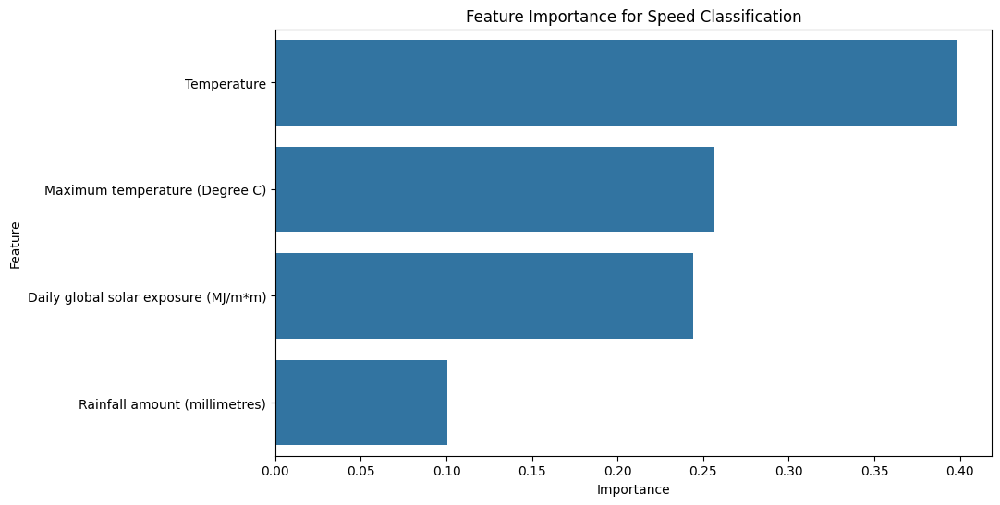

Accuracy (Distance Travelled): 0.60
              precision    recall  f1-score   support

           0       0.64      0.60      0.62        93
           1       0.55      0.60      0.57        77

    accuracy                           0.60       170
   macro avg       0.60      0.60      0.60       170
weighted avg       0.60      0.60      0.60       170



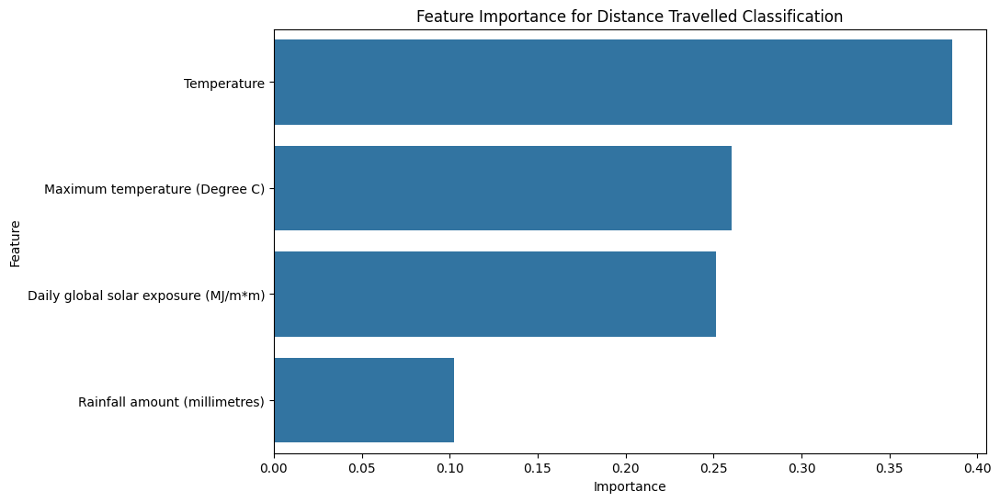

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns

data = catherine_df_cleaned_gps
data['AEST Time'] = pd.to_datetime(data['AEST Time'])
data['date'] = pd.to_datetime(data['date'])
data.fillna(method='ffill', inplace=True)
features = ['Temperature', 'Rainfall amount (millimetres)', 'Daily global solar exposure (MJ/m*m)', 'Maximum temperature (Degree C)']
X = data[features]

# Model 1: Classification based on Speed
data['Speed_Activity'] = np.where(data['Speed'] > data['Speed'].median(), 'Active', 'Inactive')
y_speed = data['Speed_Activity']
y_speed = y_speed.map({'Active': 1, 'Inactive': 0})
X_train_speed, X_test_speed, y_train_speed, y_test_speed = train_test_split(X, y_speed, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_speed = scaler.fit_transform(X_train_speed)
X_test_speed = scaler.transform(X_test_speed)
model_speed = RandomForestClassifier(n_estimators=100, random_state=42)
model_speed.fit(X_train_speed, y_train_speed)
y_pred_speed = model_speed.predict(X_test_speed)


accuracy_speed = accuracy_score(y_test_speed, y_pred_speed)
print(f'Accuracy (Speed): {accuracy_speed:.2f}')
print(classification_report(y_test_speed, y_pred_speed))

importances_speed = model_speed.feature_importances_
indices_speed = np.argsort(importances_speed)[::-1]

plt.figure(figsize=(10, 6))
sns.barplot(x=importances_speed[indices_speed], y=np.array(features)[indices_speed])
plt.title('Feature Importance for Speed Classification')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

# Model 2: Classification based on Distance Travelled
data['Distance_Activity'] = np.where(data['DistanceTravelled'] > data['DistanceTravelled'].median(), 'Active', 'Inactive')
y_distance = data['Distance_Activity']
y_distance = y_distance.map({'Active': 1, 'Inactive': 0})
X_train_distance, X_test_distance, y_train_distance, y_test_distance = train_test_split(X, y_distance, test_size=0.2, random_state=42)
X_train_distance = scaler.fit_transform(X_train_distance)
X_test_distance = scaler.transform(X_test_distance)

model_distance = RandomForestClassifier(n_estimators=100, random_state=42)
model_distance.fit(X_train_distance, y_train_distance)
y_pred_distance = model_distance.predict(X_test_distance)

accuracy_distance = accuracy_score(y_test_distance, y_pred_distance)
print(f'Accuracy (Distance Travelled): {accuracy_distance:.2f}')
print(classification_report(y_test_distance, y_pred_distance))

importances_distance = model_distance.feature_importances_
indices_distance = np.argsort(importances_distance)[::-1]
plt.figure(figsize=(10, 6))
sns.barplot(x=importances_distance[indices_distance], y=np.array(features)[indices_distance])
plt.title('Feature Importance for Distance Travelled Classification')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


Fitting 3 folds for each of 3 candidates, totalling 9 fits
Best Parameters (Ridge): {'alpha': 10.0}
Best Score (Ridge): -0.02
Ridge Regression Mean Squared Error: 3703570.24
Ridge Regression R-squared: -0.01


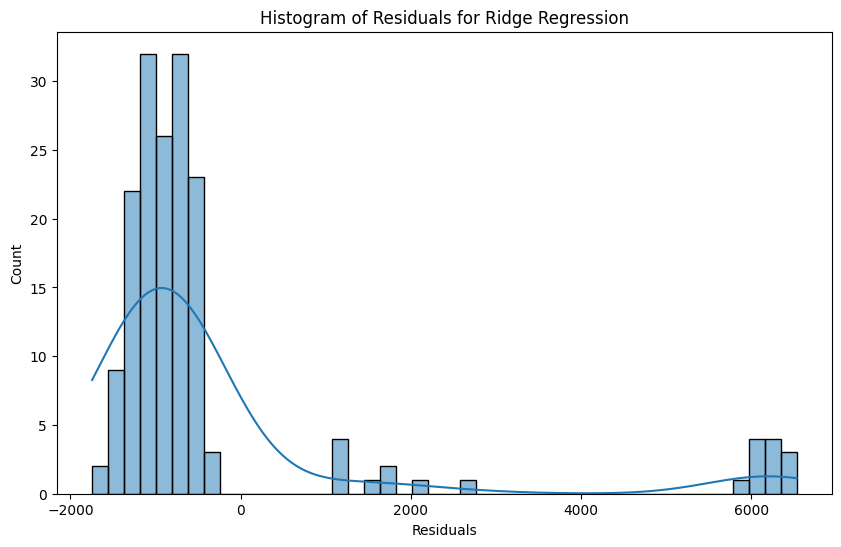

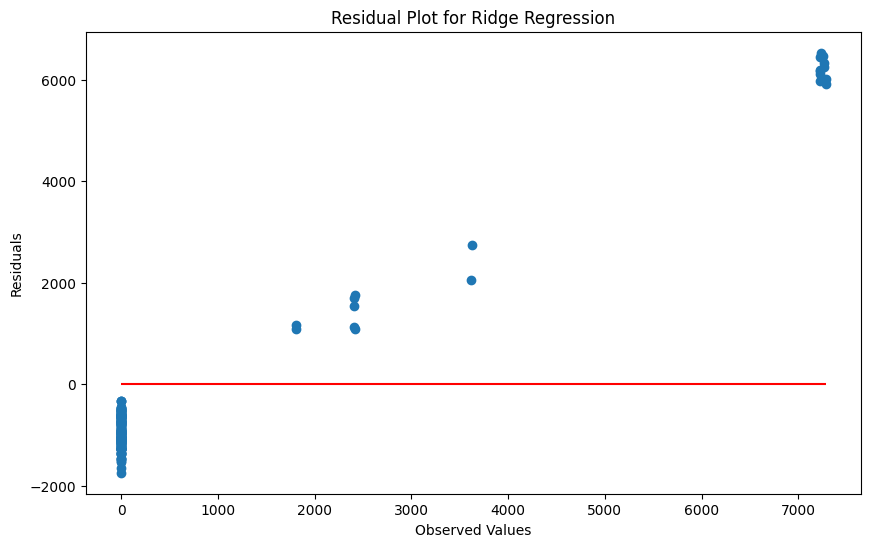

Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best Parameters (RF): {'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 50}
Best Score (RF): 0.57
Accuracy: 0.59
F1 Score: 0.54
ROC AUC: 0.62
Confusion Matrix:
[[59 36]
 [34 41]]
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.62      0.63        95
           1       0.53      0.55      0.54        75

    accuracy                           0.59       170
   macro avg       0.58      0.58      0.58       170
weighted avg       0.59      0.59      0.59       170



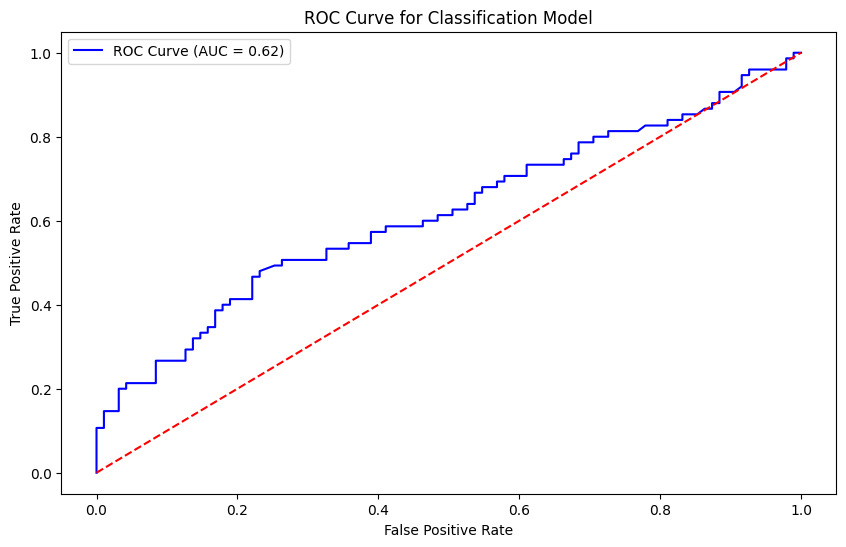

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, classification_report, roc_curve, auc, f1_score, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

data = catherine_df_cleaned_gps

data['AEST Time'] = pd.to_datetime(data['AEST Time'])
data['date'] = pd.to_datetime(data['date'])

data.fillna(method='ffill', inplace=True)

features = ['Temperature', 'Rainfall amount (millimetres)', 'Daily global solar exposure (MJ/m*m)', 'Maximum temperature (Degree C)']
X = data[features]

# Regression Model: Predicting Distance Travelled
y_regression = data['Speed']
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X, y_regression, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_reg = scaler.fit_transform(X_train_reg)
X_test_reg = scaler.transform(X_test_reg)

# Hyperparameter Tuning using GridSearch
param_grid_ridge = {
    'alpha': [0.1, 1.0, 10.0]
}
grid_search_ridge = GridSearchCV(estimator=Ridge(), param_grid=param_grid_ridge, cv=3, n_jobs=-1, verbose=2)
grid_search_ridge.fit(X_train_reg, y_train_reg)

# Best parameters and best score for Ridge Regression
print(f'Best Parameters (Ridge): {grid_search_ridge.best_params_}')
print(f'Best Score (Ridge): {grid_search_ridge.best_score_:.2f}')

# Model evaluation with best parameters for Ridge Regression
best_model_ridge = grid_search_ridge.best_estimator_
y_pred_ridge = best_model_ridge.predict(X_test_reg)
mse_ridge = mean_squared_error(y_test_reg, y_pred_ridge)
r2_ridge = r2_score(y_test_reg, y_pred_ridge)
print(f'Ridge Regression Mean Squared Error: {mse_ridge:.2f}')
print(f'Ridge Regression R-squared: {r2_ridge:.2f}')
residuals_ridge = y_test_reg - y_pred_ridge
plt.figure(figsize=(10, 6))
sns.histplot(residuals_ridge, kde=True)
plt.xlabel('Residuals')
plt.title('Histogram of Residuals for Ridge Regression')
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_test_reg, residuals_ridge)
plt.hlines(y=0, xmin=y_test_reg.min(), xmax=y_test_reg.max(), colors='red')
plt.xlabel('Observed Values')
plt.ylabel('Residuals')
plt.title('Residual Plot for Ridge Regression')
plt.show()

# Classification Model: Predicting Activity based on Speed
data['Speed_Activity'] = np.where(data['Speed'] > data['Speed'].median(), 'Active', 'Inactive')
y_classification = data['Speed_Activity']
y_classification = y_classification.map({'Active': 1, 'Inactive': 0})
X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(X, y_classification, test_size=0.2, random_state=42)
X_train_class = scaler.fit_transform(X_train_class)
X_test_class = scaler.transform(X_test_class)

# Hyperparameter Tuning using GridSearchCV for RandomForestClassifier
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search_rf = GridSearchCV(estimator=RandomForestClassifier(random_state=42), param_grid=param_grid_rf, cv=3, n_jobs=-1, verbose=2)
grid_search_rf.fit(X_train_class, y_train_class)

print(f'Best Parameters (RF): {grid_search_rf.best_params_}')
print(f'Best Score (RF): {grid_search_rf.best_score_:.2f}')

best_model_rf = grid_search_rf.best_estimator_
y_pred_class = best_model_rf.predict(X_test_class)
y_prob_class = best_model_rf.predict_proba(X_test_class)[:, 1]

# Model evaluation for Classification
accuracy = accuracy_score(y_test_class, y_pred_class)
f1 = f1_score(y_test_class, y_pred_class)
conf_matrix = confusion_matrix(y_test_class, y_pred_class)
roc_auc = roc_auc_score(y_test_class, y_prob_class)

print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')
print(f'ROC AUC: {roc_auc:.2f}')
print('Confusion Matrix:')
print(conf_matrix)
print('Classification Report:')
print(classification_report(y_test_class, y_pred_class))

# Plot ROC Curve
fpr, tpr, thresholds = roc_curve(y_test_class, y_prob_class)
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Classification Model')
plt.legend()
plt.show()


# **Data analytics process**

**task 16.** Describe the components of the data analytics process and illustrate your answer from the work you have carried out on your chosen dataset.

Analysis of Koala Activity
Weather Conditions:

Koalas' speed and distance vary significantly with weather, showing reduced activity during extreme conditions.
Time of Day:

Activity patterns correlate with specific hours, indicating higher activity during certain periods.
Predicted Trajectories:

Next location predictions show clear patterns, which are useful for understanding movement behavior.